### Insurance Claim Fraud Detection

Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem. In this dataset it has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made. 

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [2]:
df = pd.read_csv("https://raw.githubusercontent.com/dsrscientist/Data-Science-ML-Capstone-Projects/master/Automobile_insurance_fraud.csv")
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


In [3]:
df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


In [4]:
df.tail()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN
999,456,60,556080,11-11-1996,OH,250/500,1000,766.19,0,612260,...,?,5060,460,920,3680,Mercedes,E400,2007,N,NaN


In [5]:
df.shape

(1000, 40)

This dataset Contains 1000 rows and 40 columns.

In [6]:
df.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

#### Independent features
1.	months_as_customer: Number of months of patronage
2.	age: the length of time a customer has lived or a thing has existed
3.	policy_number: It is a unique id given to the customer, to track the subscription status and other details of customer
4.	policy_bind_date:date which document that is given to customer after we accept your proposal for insurance
5.	policy_state: This identifies who is the insured, what risks or property are covered, the policy limits, and the policy period
6.	policy_csl: is basically Combined Single Limit
7.	policy_deductable: the amount of money that a customer is responsible for paying toward an insured loss
8.	policy_annual_premium: This means the amount of Regular Premium payable by the Policyholder in a Policy Year
9.	umbrella_limit: This means extra insurance that provides protection beyond existing limits and coverages of other policies
10.	insured_zip: It is the zip code where the insurance was made
11.	insured_sex: This refres to either of the two main categories (male and female) into which customer are divided on the basis of their reproductive functions
12.	insured_education_level: This refers to the Level of education of the customer
13.	insured_occupation: This refers Occupation of the customer
14.	insured_hobbies: This refers to an activity done regularly by customer in his/her leisure time for pleasure.
15.	insured_relationship: This whether customer is: single; or. married; or. in a de facto relationship (that is, living together but not married); or. in a civil partnership
16.	capital-gains: This refers to profit accrued due to insurance premium
17.	capital-loss: This refers to the losses incurred due to insurance claims
18.	incident_date: This refers to the date which claims where made by customers
19.	incident_type: This refers to the type of claim/vehicle damage made by customer
20.	collision_type: This refers to the area of damage on the vehicle
21.	incident_severity: This refers to the extent/level of damage
22.	authorities_contacted: This refers to the government agencies that were contacted after damage
23.	incident_state: This refers to the state at which the accident happened
24.	incident_city: This refers to the city at which the accident happened
25.	1ncident_location: This refers to the location at which the accident happened
26.	incident_hour_of_the_day: The period of the day which accident took place
27.	number_of_vehicles_involved: This refers to number of vehicles involved the accident
28.	property_damage: This refers to whether property was damaged or not
29.	bodily_injuries: This refers to injuries sustained
30.	witnesses: This refers to the number of witnesses involved
31.	police_report_available: This refers to whether the report on damage was documented or not
32.	total_claim_amount: This refers to the financial implications involved in claims
33.	injury_claim: This refers to physical injuries sustained
34.	property_claim: This refers to property damages during incident
35.	vehicle_claim: This refers to property damages during incident
36.	auto_make: This refers to the make of the vehicle
37.	auto_model: This refers to the model of the vehicle
38.	auto_year: This refers to the year which the vehicle was manufactured.
    
#### Target Variable
40.	fraud_reported

since our target variable is categorical data. so this problem will be considered as classification and we will be building classification model


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

We see there are 1000 rows and 40 columns in which 2 columns are float, 17 columns are integer and 21 columns are object which need to be converted to numeric values. There are no null values in any column except _C39 which has all null values so we will be dropping this column. We need to predict Fraud_reported which is of categorical type so we will build a classification model.

In [8]:
df.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

In [9]:
df.drop("_c39",axis = 1, inplace= True)

In [10]:
for i in df:
    print(df[i].value_counts())
    print("*" *70)

194    8
128    7
254    7
140    7
210    7
      ..
390    1
411    1
453    1
448    1
17     1
Name: months_as_customer, Length: 391, dtype: int64
**********************************************************************
43    49
39    48
41    45
34    44
38    42
30    42
31    42
37    41
33    39
40    38
32    38
29    35
46    33
42    32
35    32
36    32
44    32
28    30
26    26
45    26
48    25
47    24
27    24
57    16
25    14
55    14
49    14
53    13
50    13
24    10
54    10
61    10
51     9
60     9
58     8
56     8
23     7
21     6
59     5
62     4
52     4
64     2
63     2
19     1
20     1
22     1
Name: age, dtype: int64
**********************************************************************
521585    1
687755    1
674485    1
223404    1
991480    1
         ..
563878    1
620855    1
583169    1
337677    1
556080    1
Name: policy_number, Length: 1000, dtype: int64
**********************************************************************
01-01-2006    3
28

In [11]:
df['umbrella_limit'].value_counts()

 0           798
 6000000      57
 5000000      46
 4000000      39
 7000000      29
 3000000      12
 8000000       8
 9000000       5
 2000000       3
 10000000      2
-1000000       1
Name: umbrella_limit, dtype: int64

In [13]:
df['collision_type'].value_counts()

Rear Collision     292
Side Collision     276
Front Collision    254
?                  178
Name: collision_type, dtype: int64

In [14]:
df['property_damage'].value_counts()

?      360
NO     338
YES    302
Name: property_damage, dtype: int64

In [15]:
df['police_report_available'].value_counts()

?      343
NO     343
YES    314
Name: police_report_available, dtype: int64

In [16]:
df = df.replace("?", np.nan)

In [17]:
df.isnull().sum()

months_as_customer               0
age                              0
policy_number                    0
policy_bind_date                 0
policy_state                     0
policy_csl                       0
policy_deductable                0
policy_annual_premium            0
umbrella_limit                   0
insured_zip                      0
insured_sex                      0
insured_education_level          0
insured_occupation               0
insured_hobbies                  0
insured_relationship             0
capital-gains                    0
capital-loss                     0
incident_date                    0
incident_type                    0
collision_type                 178
incident_severity                0
authorities_contacted            0
incident_state                   0
incident_city                    0
incident_location                0
incident_hour_of_the_day         0
number_of_vehicles_involved      0
property_damage                360
bodily_injuries     

In [19]:
df["collision_type"].fillna(df["collision_type"].mode()[0], inplace = True)
df["property_damage"].fillna(df["property_damage"].mode()[0], inplace = True)
df["police_report_available"].fillna(df["police_report_available"].mode()[0], inplace = True)

In [20]:
df.loc[df['umbrella_limit']== -1000000]

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
290,284,42,526039,04-05-1995,OH,100/300,500,1338.54,-1000000,438178,...,1,NO,94160,8560,17120,68480,Chevrolet,Malibu,1996,N


In [21]:
df.drop(df[df['umbrella_limit']== -1000000].index,inplace=True)

In [22]:
df[['incident_date','incident_month','incident_year']] = df['incident_date'].str.split("-",expand = True)
df[['incident_date','incident_month','incident_year']] = df[['incident_date','incident_month','incident_year']].astype(int)

df[['policy_bind_date','policy_bind_month','policy_bind_year']] = df['policy_bind_date'].str.split("-",expand = True)
df[['policy_bind_date','policy_bind_month','policy_bind_year']] = df[['policy_bind_date','policy_bind_month','policy_bind_year']].astype(int)

df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,incident_month,incident_year,policy_bind_month,policy_bind_year
0,328,48,521585,17,OH,250/500,1000,1406.91,0,466132,...,13020,52080,Saab,92x,2004,Y,1,2015,10,2014
1,228,42,342868,27,IN,250/500,2000,1197.22,5000000,468176,...,780,3510,Mercedes,E400,2007,Y,1,2015,6,2006
2,134,29,687698,6,OH,100/300,2000,1413.14,5000000,430632,...,3850,23100,Dodge,RAM,2007,N,2,2015,9,2000
3,256,41,227811,25,IL,250/500,2000,1415.74,6000000,608117,...,6340,50720,Chevrolet,Tahoe,2014,Y,1,2015,5,1990
4,228,44,367455,6,IL,500/1000,1000,1583.91,6000000,610706,...,650,4550,Accura,RSX,2009,N,2,2015,6,2014
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16,OH,500/1000,1000,1310.80,0,431289,...,8720,61040,Honda,Accord,2006,N,2,2015,7,1991
996,285,41,186934,5,IL,100/300,1000,1436.79,0,608177,...,18080,72320,Volkswagen,Passat,2015,N,1,2015,1,2014
997,130,34,918516,17,OH,250/500,500,1383.49,3000000,442797,...,7500,52500,Suburu,Impreza,1996,N,1,2015,2,2003
998,458,62,533940,18,IL,500/1000,2000,1356.92,5000000,441714,...,5220,36540,Audi,A5,1998,N,2,2015,11,2011


We will drop this incident_year since it has only one value which is notbuseful.

In [23]:
df.nunique()

months_as_customer             391
age                             46
policy_number                  999
policy_bind_date                31
policy_state                     3
policy_csl                       3
policy_deductable                3
policy_annual_premium          990
umbrella_limit                  10
insured_zip                    994
insured_sex                      2
insured_education_level          7
insured_occupation              14
insured_hobbies                 20
insured_relationship             6
capital-gains                  338
capital-loss                   354
incident_date                   31
incident_type                    4
collision_type                   3
incident_severity                4
authorities_contacted            5
incident_state                   7
incident_city                    7
incident_location              999
incident_hour_of_the_day        24
number_of_vehicles_involved      4
property_damage                  2
bodily_injuries     

In [24]:
df.drop(['incident_year'],axis=1, inplace=True)

In [25]:
# we will drop 'policy_number','insured_zip','incident_location' since it has all different values
df.drop(['policy_number','insured_zip','incident_location'],axis=1, inplace=True)

In [26]:
df.shape

(999, 39)

In [27]:
df.columns

Index(['months_as_customer', 'age', 'policy_bind_date', 'policy_state',
       'policy_csl', 'policy_deductable', 'policy_annual_premium',
       'umbrella_limit', 'insured_sex', 'insured_education_level',
       'insured_occupation', 'insured_hobbies', 'insured_relationship',
       'capital-gains', 'capital-loss', 'incident_date', 'incident_type',
       'collision_type', 'incident_severity', 'authorities_contacted',
       'incident_state', 'incident_city', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', 'incident_month',
       'policy_bind_month', 'policy_bind_year'],
      dtype='object')

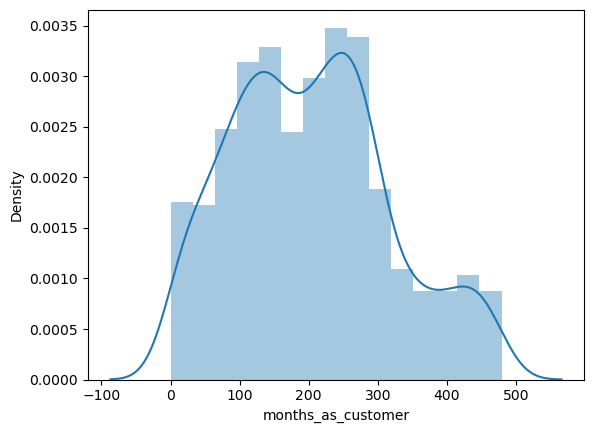

In [28]:
sns.distplot(df["months_as_customer"])
plt.show()

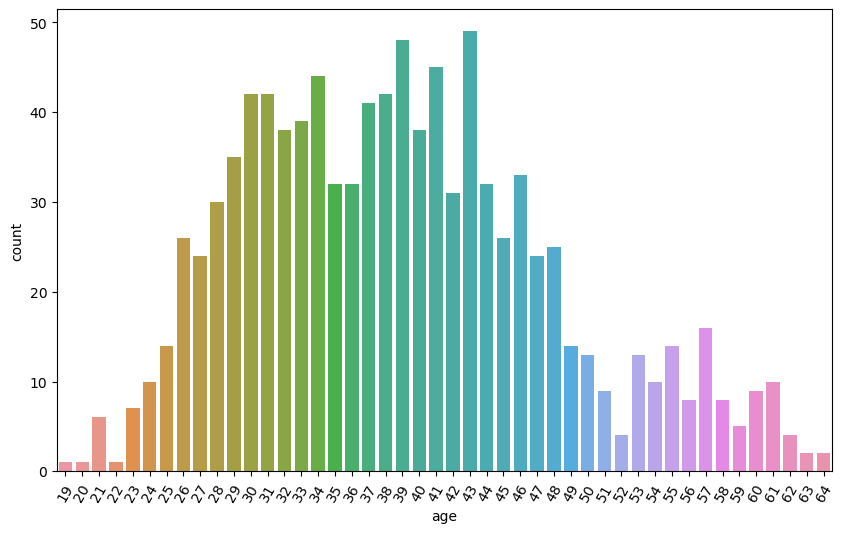

In [29]:
plt.figure(figsize = (10,6))
sns.countplot(df["age"])
plt.xticks(rotation = 60)
plt.show()

We see there are people who are aged between 19 to 64. Most of them are of age between 35 to 43.

<AxesSubplot:xlabel='fraud_reported', ylabel='count'>

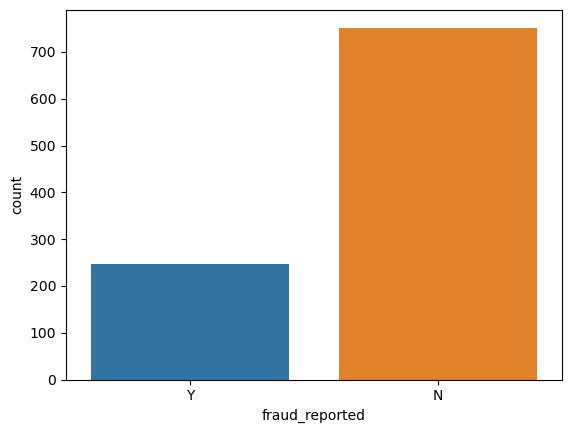

In [30]:
sns.countplot(df['fraud_reported'])

We see there is huge data imbalance. so we need to balnce the dataset at end.

In [31]:
df.describe()

,months_as_customer,age,policy_bind_date,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_date,incident_hour_of_the_day,...,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,incident_month,policy_bind_month,policy_bind_year
count,999.000000,999.000000,999.000000,999.000000,999.000000,9.990000e+02,999.000000,999.000000,999.000000,999.000000,...,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000
mean,203.873874,38.944945,15.459459,1136.636637,1256.323934,1.103103e+06,25151.251251,-26820.520521,14.980981,11.642643,...,0.992993,1.487487,52720.500501,7432.292292,7389.839840,37898.368368,2005.112112,1.496496,6.560561,2001.610611
std,115.142928,9.144354,8.804951,611.839681,244.275843,2.297594e+06,27874.792269,28105.366259,8.663993,6.954722,...,0.819936,1.111785,26382.199299,4883.266266,4817.316312,18870.924206,6.011966,0.523724,3.501229,7.361107
min,0.000000,19.000000,1.000000,500.000000,433.330000,0.000000e+00,0.000000,-111100.000000,1.000000,0.000000,...,0.000000,0.000000,100.000000,0.000000,0.000000,70.000000,1995.000000,1.000000,1.000000,1990.000000
25%,115.500000,32.000000,8.000000,500.000000,1089.185000,0.000000e+00,0.000000,-51500.000000,7.500000,6.000000,...,0.000000,1.000000,41775.000000,4290.000000,4440.000000,30275.000000,2000.000000,1.000000,3.000000,1995.000000
50%,199.000000,38.000000,16.000000,1000.000000,1257.040000,0.000000e+00,0.000000,-24100.000000,15.000000,12.000000,...,1.000000,1.000000,57970.000000,6770.000000,6750.000000,42080.000000,2005.000000,1.000000,7.000000,2002.000000
75%,276.000000,44.000000,23.000000,2000.000000,1415.710000,0.000000e+00,51050.000000,0.000000,22.000000,17.000000,...,2.000000,2.000000,70550.000000,11310.000000,10870.000000,50775.000000,2010.000000,2.000000,10.000000,2008.000000
max,479.000000,64.000000,31.000000,2000.000000,2047.590000,1.000000e+07,100500.000000,0.000000,31.000000,23.000000,...,2.000000,3.000000,114920.000000,21450.000000,23670.000000,79560.000000,2015.000000,3.000000,12.000000,2015.000000


We see that
1. Count of all the values are same.
2. Standard deviation is less than the mean in most of the columns except umbrella-limit and capital gains.
3. There is slight skewness in most of the columns.
4. There is also a huge difference between percentiles and max.

<AxesSubplot:xlabel='policy_bind_date', ylabel='count'>

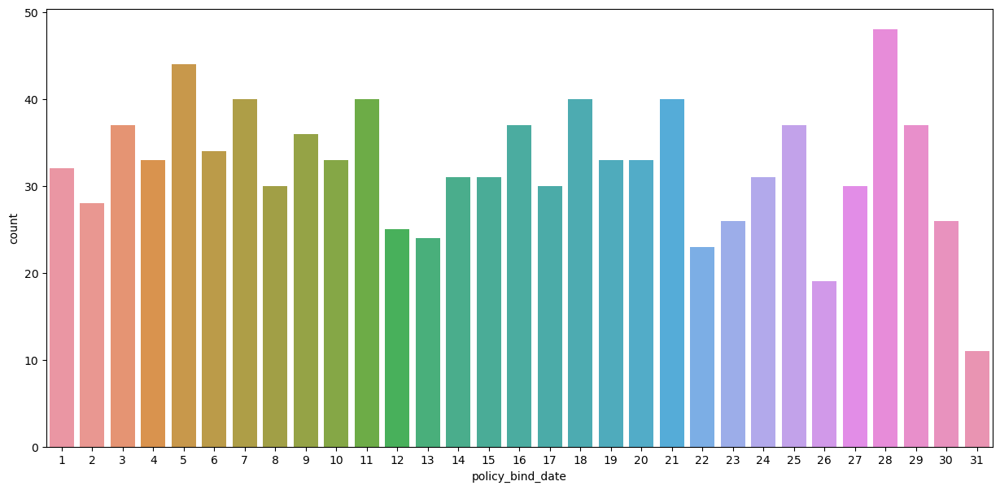

In [32]:
plt.figure(figsize=(15, 7))
sns.countplot(df['policy_bind_date'])

<AxesSubplot:xlabel='policy_bind_month', ylabel='count'>

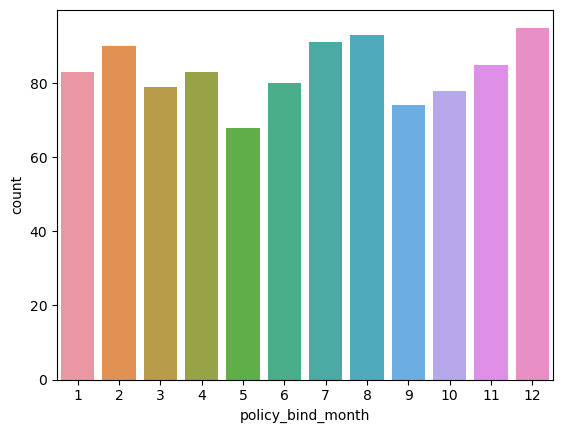

In [33]:
sns.countplot(df["policy_bind_month"])

<AxesSubplot:xlabel='policy_bind_year', ylabel='count'>

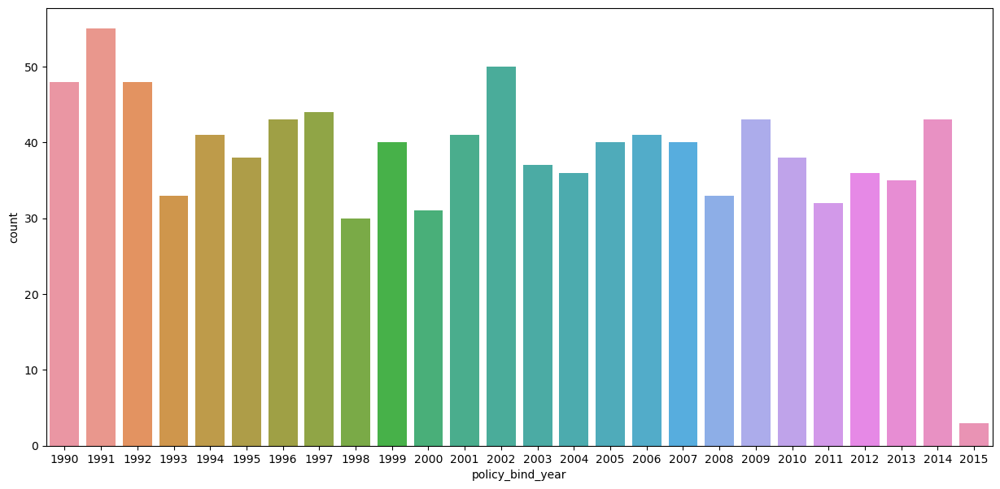

In [34]:
plt.figure(figsize=(15,7))
sns.countplot(df["policy_bind_year"])

<AxesSubplot:xlabel='incident_date', ylabel='count'>

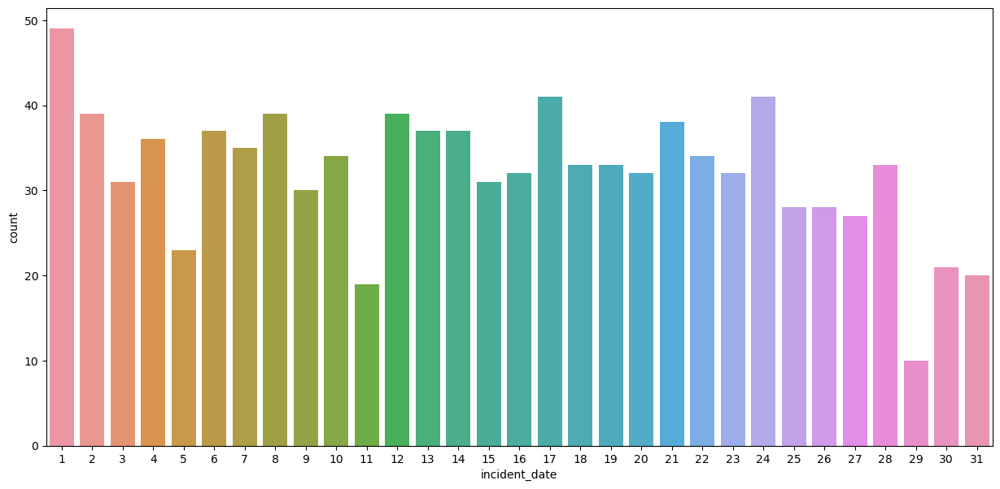

In [35]:
plt.figure(figsize = (15,7))
sns.countplot(df["incident_date"])

<AxesSubplot:xlabel='incident_month', ylabel='count'>

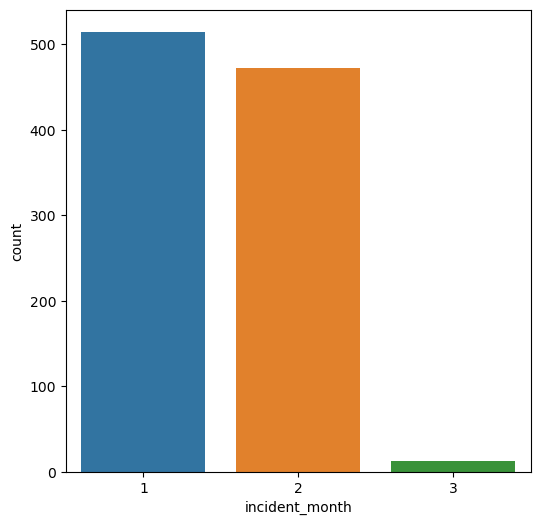

In [36]:
plt.figure(figsize = (6,6))
sns.countplot(df["incident_month"])

<AxesSubplot:xlabel='policy_state', ylabel='count'>

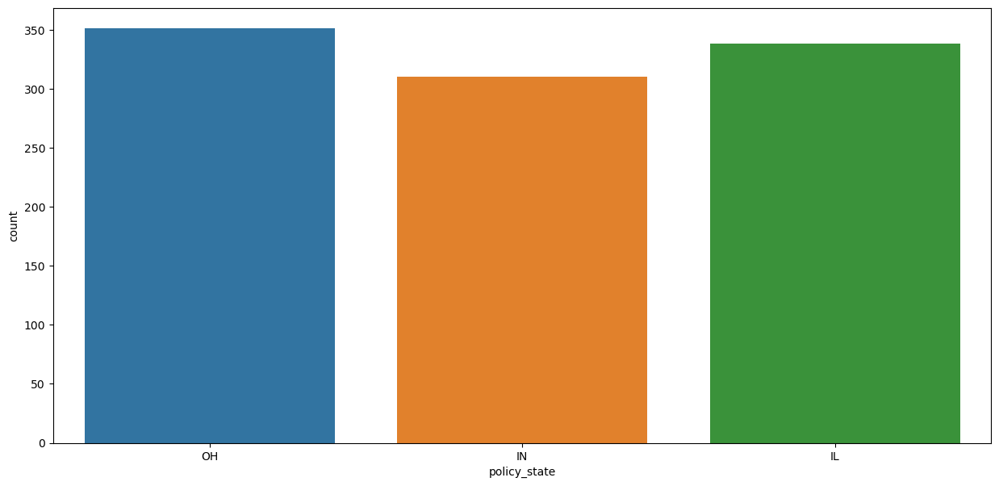

In [37]:
plt.figure(figsize = (15,7))
sns.countplot(df["policy_state"])

<AxesSubplot:xlabel='policy_csl', ylabel='count'>

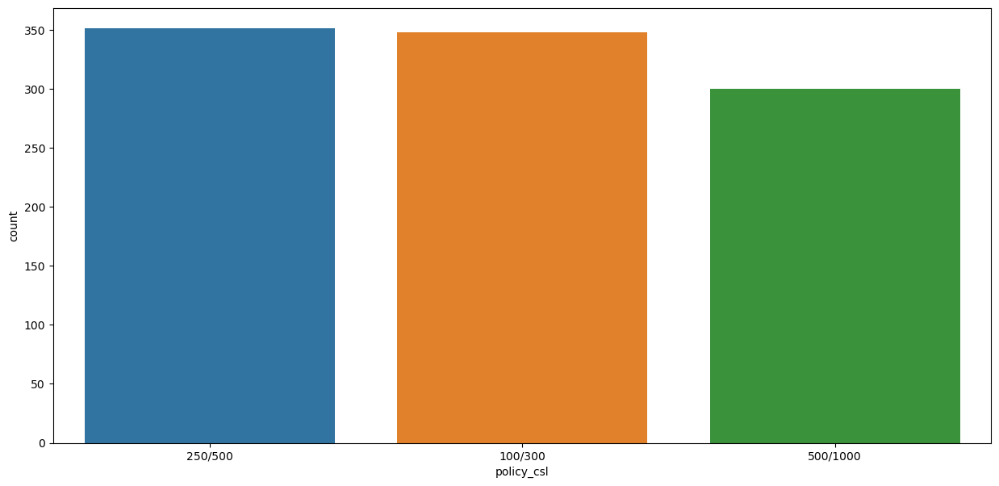

In [38]:
plt.figure(figsize = (15,7))
sns.countplot(df["policy_csl"])

<AxesSubplot:xlabel='policy_deductable', ylabel='Density'>

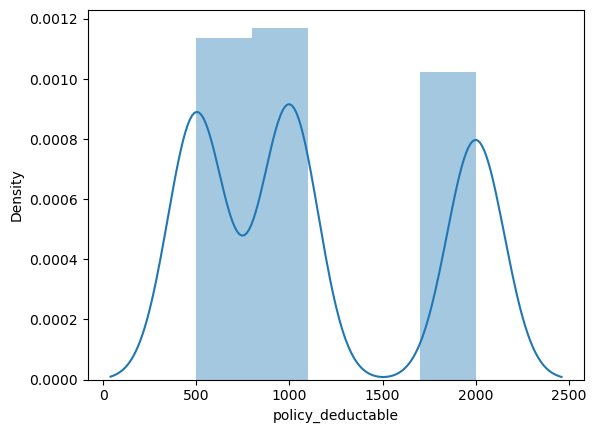

In [39]:
sns.distplot(df["policy_deductable"])

<AxesSubplot:xlabel='policy_annual_premium', ylabel='Density'>

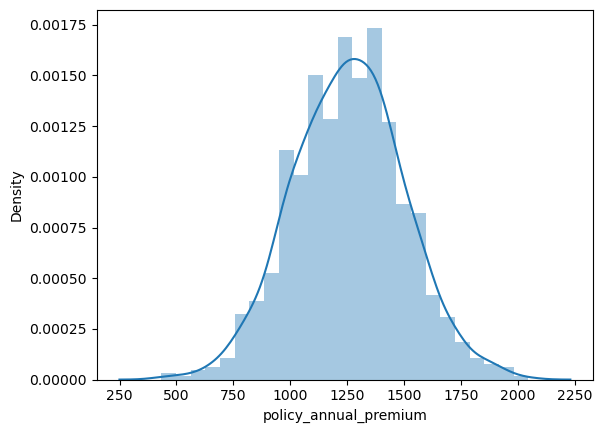

In [40]:
sns.distplot(df['policy_annual_premium'])

<AxesSubplot:xlabel='incident_hour_of_the_day', ylabel='count'>

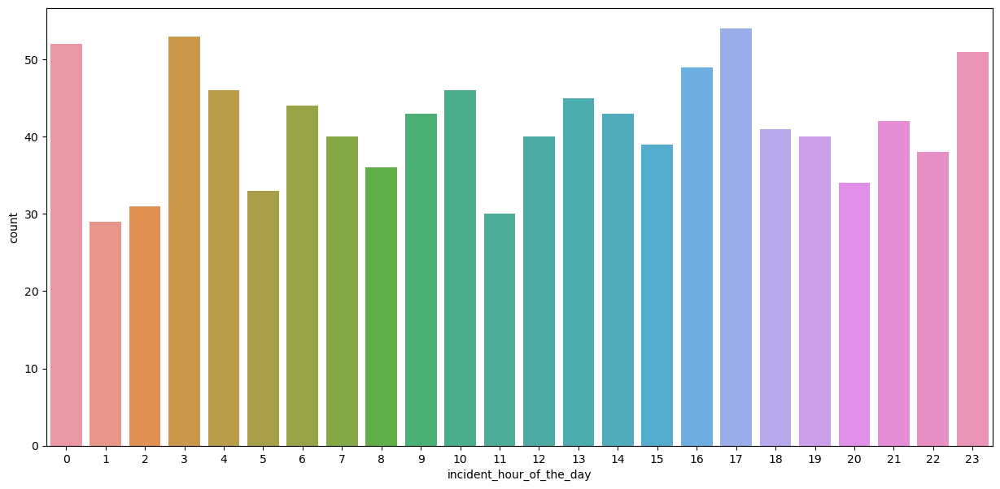

In [41]:
plt.figure(figsize = (15,7))
sns.countplot(df['incident_hour_of_the_day'])

<AxesSubplot:xlabel='insured_sex', ylabel='count'>

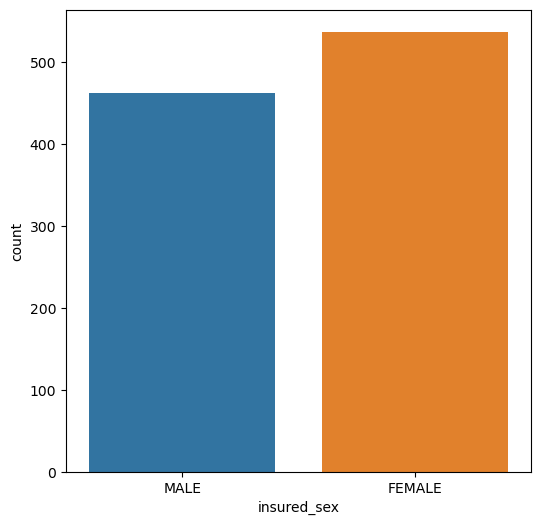

In [42]:
plt.figure(figsize = (6,6))
sns.countplot(df['insured_sex'])

(array([0, 1, 2, 3, 4, 5, 6]),
 [Text(0, 0, 'MD'),
  Text(1, 0, 'PhD'),
  Text(2, 0, 'Associate'),
  Text(3, 0, 'Masters'),
  Text(4, 0, 'High School'),
  Text(5, 0, 'College'),
  Text(6, 0, 'JD')])

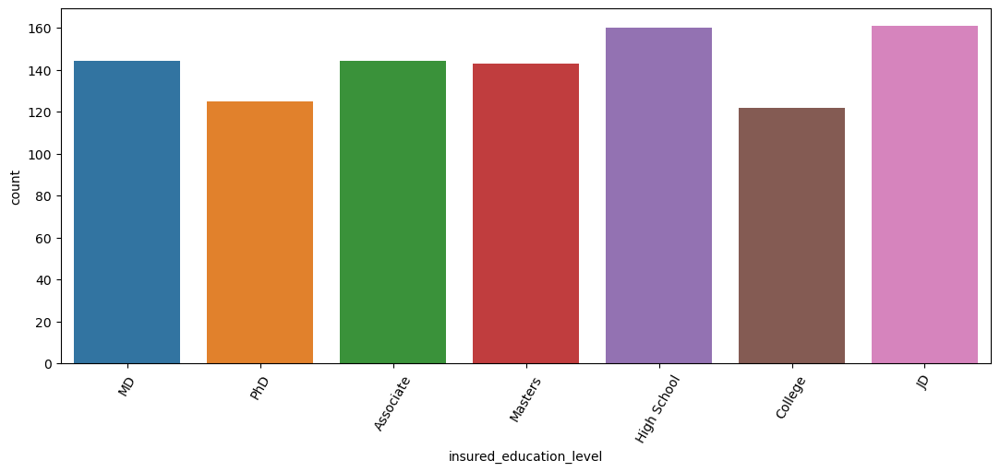

In [43]:
plt.figure(figsize = (13,5))
sns.countplot(df['insured_education_level'])
plt.xticks(rotation=60)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13]),
 [Text(0, 0, 'craft-repair'),
  Text(1, 0, 'machine-op-inspct'),
  Text(2, 0, 'sales'),
  Text(3, 0, 'armed-forces'),
  Text(4, 0, 'tech-support'),
  Text(5, 0, 'prof-specialty'),
  Text(6, 0, 'other-service'),
  Text(7, 0, 'priv-house-serv'),
  Text(8, 0, 'exec-managerial'),
  Text(9, 0, 'protective-serv'),
  Text(10, 0, 'transport-moving'),
  Text(11, 0, 'handlers-cleaners'),
  Text(12, 0, 'adm-clerical'),
  Text(13, 0, 'farming-fishing')])

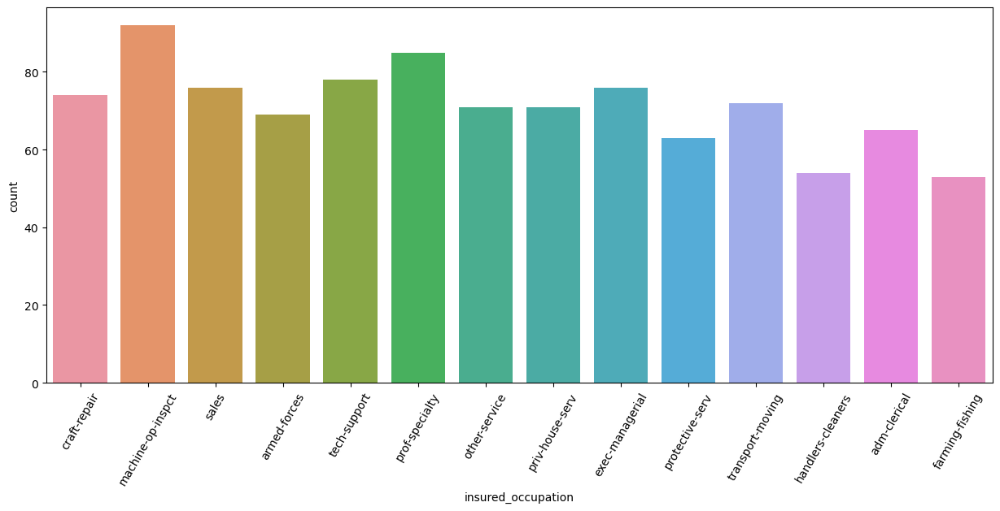

In [44]:
plt.figure(figsize = (15,6))
sns.countplot(df['insured_occupation'])
plt.xticks(rotation = 60)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19]),
 [Text(0, 0, 'sleeping'),
  Text(1, 0, 'reading'),
  Text(2, 0, 'board-games'),
  Text(3, 0, 'bungie-jumping'),
  Text(4, 0, 'base-jumping'),
  Text(5, 0, 'golf'),
  Text(6, 0, 'camping'),
  Text(7, 0, 'dancing'),
  Text(8, 0, 'skydiving'),
  Text(9, 0, 'movies'),
  Text(10, 0, 'hiking'),
  Text(11, 0, 'yachting'),
  Text(12, 0, 'paintball'),
  Text(13, 0, 'chess'),
  Text(14, 0, 'kayaking'),
  Text(15, 0, 'polo'),
  Text(16, 0, 'basketball'),
  Text(17, 0, 'video-games'),
  Text(18, 0, 'cross-fit'),
  Text(19, 0, 'exercise')])

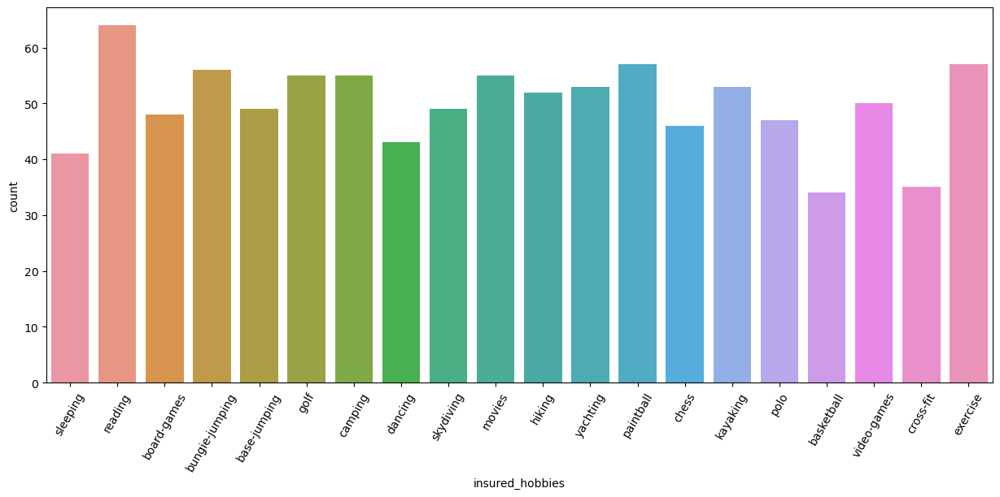

In [45]:
plt.figure(figsize = (15,6))
sns.countplot(df['insured_hobbies'])
plt.xticks(rotation = 60)

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'husband'),
  Text(1, 0, 'other-relative'),
  Text(2, 0, 'own-child'),
  Text(3, 0, 'unmarried'),
  Text(4, 0, 'wife'),
  Text(5, 0, 'not-in-family')])

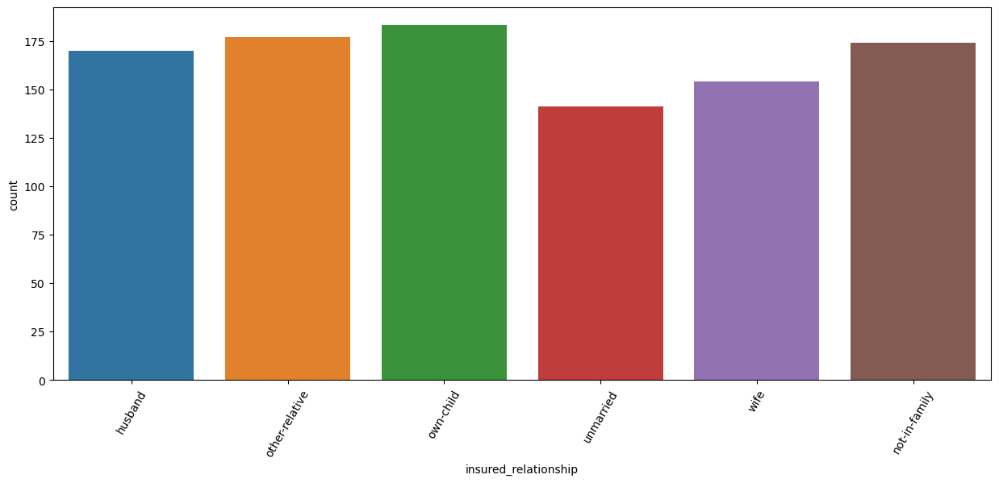

In [46]:
plt.figure(figsize = (15,6))
sns.countplot(df['insured_relationship'])
plt.xticks(rotation = 60)

(array([0, 1, 2, 3]),
 [Text(0, 0, 'Single Vehicle Collision'),
  Text(1, 0, 'Vehicle Theft'),
  Text(2, 0, 'Multi-vehicle Collision'),
  Text(3, 0, 'Parked Car')])

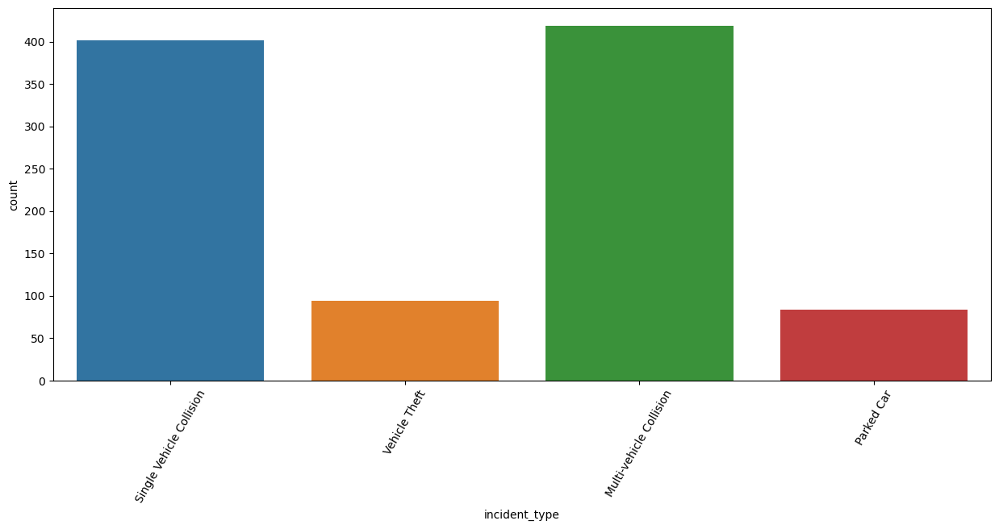

In [47]:
plt.figure(figsize = (15,6))
sns.countplot(df['incident_type'])
plt.xticks(rotation = 60)

(array([0, 1, 2, 3]),
 [Text(0, 0, 'Major Damage'),
  Text(1, 0, 'Minor Damage'),
  Text(2, 0, 'Total Loss'),
  Text(3, 0, 'Trivial Damage')])

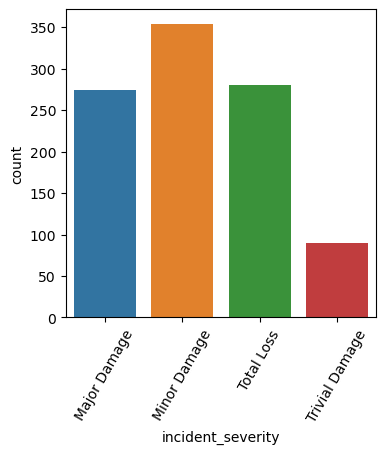

In [67]:
plt.figure(figsize = (4,4))
sns.countplot(df['incident_severity'])
plt.xticks(rotation = 60)

(array([0, 1, 2]),
 [Text(0, 0, 'Side Collision'),
  Text(1, 0, 'Rear Collision'),
  Text(2, 0, 'Front Collision')])

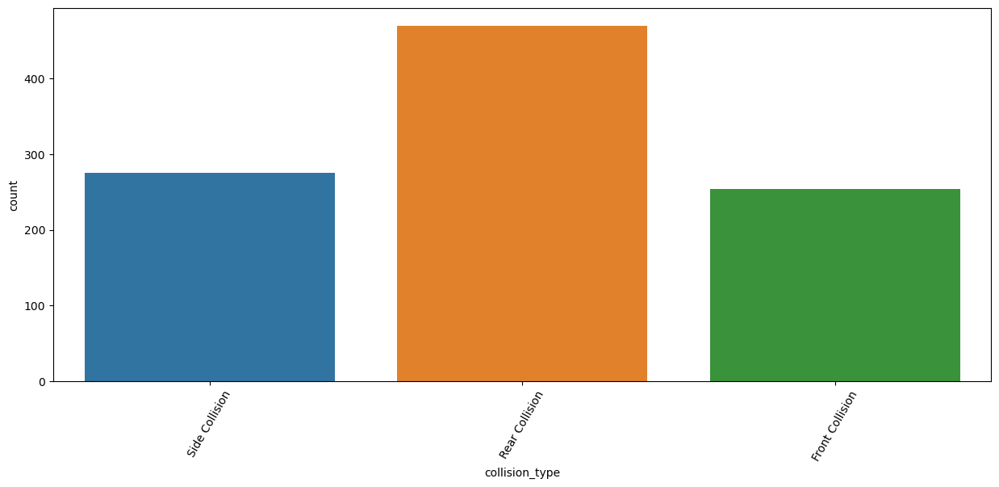

In [48]:
plt.figure(figsize = (15,6))
sns.countplot(df['collision_type'])
plt.xticks(rotation = 60)

(array([0, 1]), [Text(0, 0, 'YES'), Text(1, 0, 'NO')])

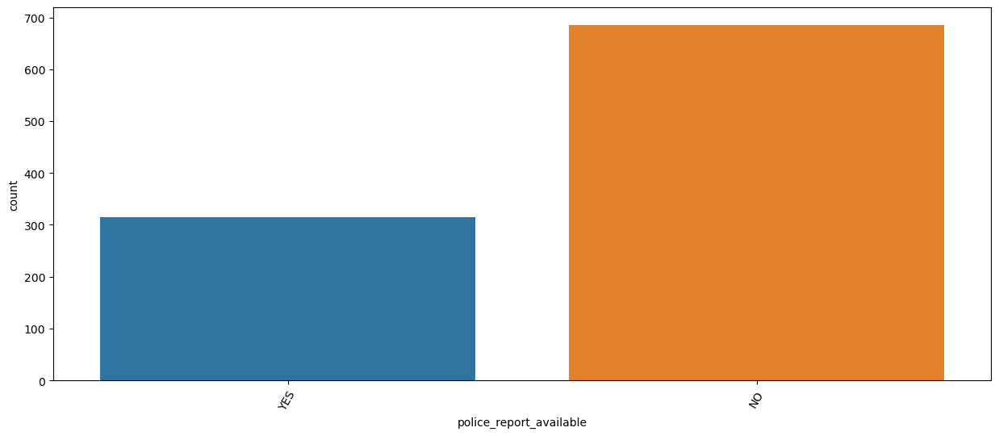

In [50]:
plt.figure(figsize = (15,6))
sns.countplot(df['police_report_available'])
plt.xticks(rotation = 60)

(array([0, 1]), [Text(0, 0, 'YES'), Text(1, 0, 'NO')])

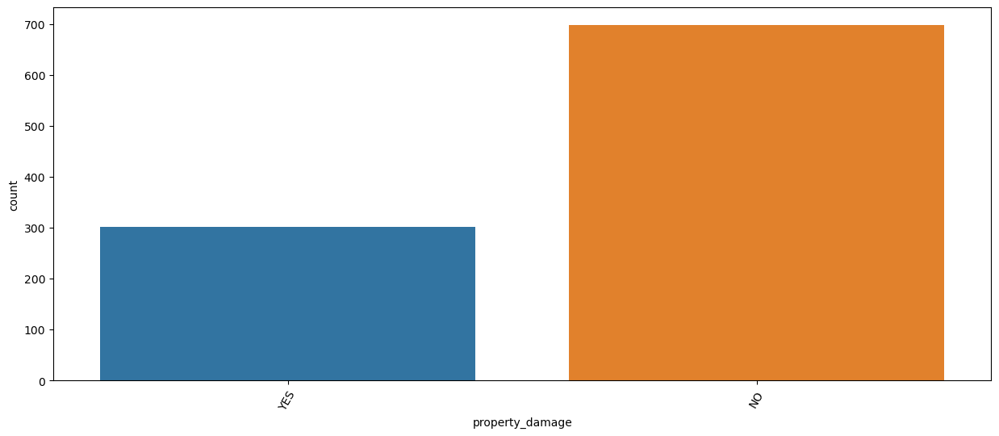

In [51]:
plt.figure(figsize = (15,6))
sns.countplot(df['property_damage'])
plt.xticks(rotation = 60)

(array([0, 1, 2, 3]),
 [Text(0, 0, '0'), Text(1, 0, '1'), Text(2, 0, '2'), Text(3, 0, '3')])

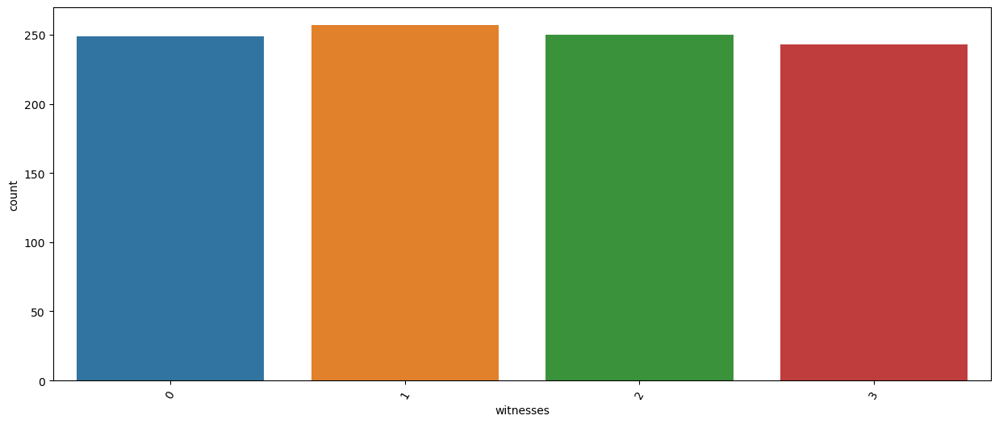

In [52]:
plt.figure(figsize = (15,6))
sns.countplot(df['witnesses'])
plt.xticks(rotation = 60)

<AxesSubplot:xlabel='total_claim_amount', ylabel='Density'>

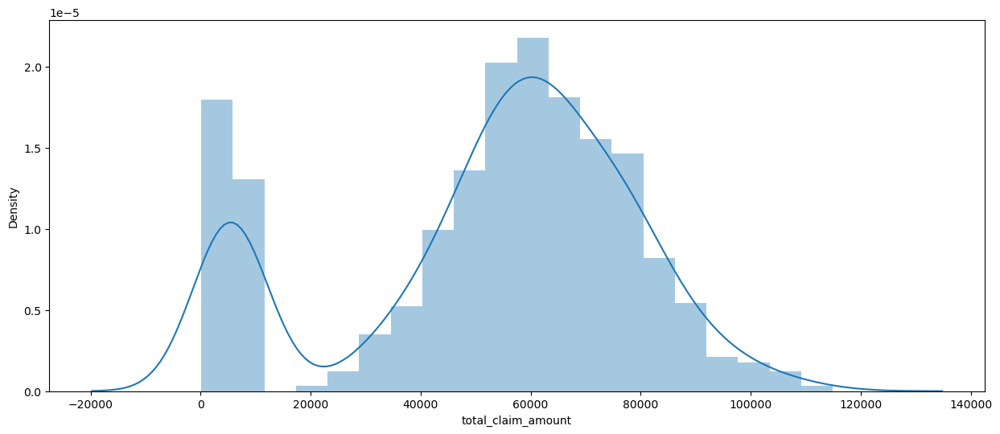

In [53]:
plt.figure(figsize = (15,6))
sns.distplot(df['total_claim_amount'])

<AxesSubplot:xlabel='injury_claim', ylabel='Density'>

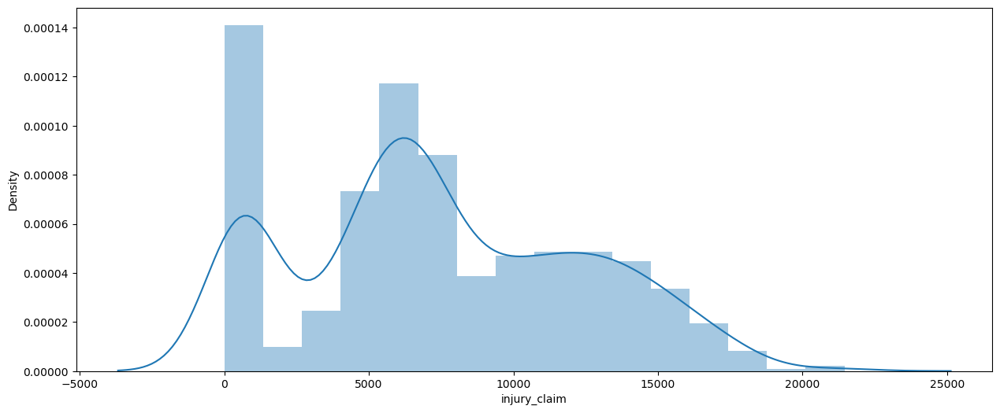

In [54]:
plt.figure(figsize = (15,6))
sns.distplot(df['injury_claim'])

<AxesSubplot:xlabel='vehicle_claim', ylabel='Density'>

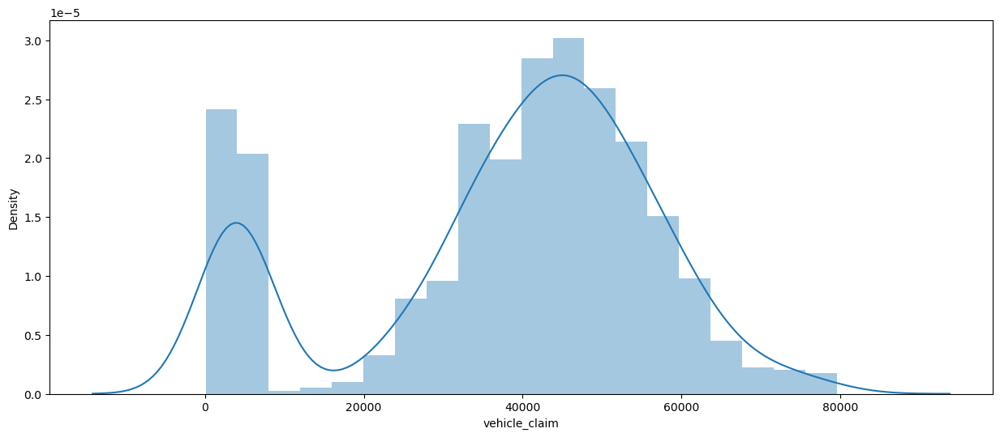

In [55]:
plt.figure(figsize = (15,6))
sns.distplot(df['vehicle_claim'])

<AxesSubplot:xlabel='property_claim', ylabel='Density'>

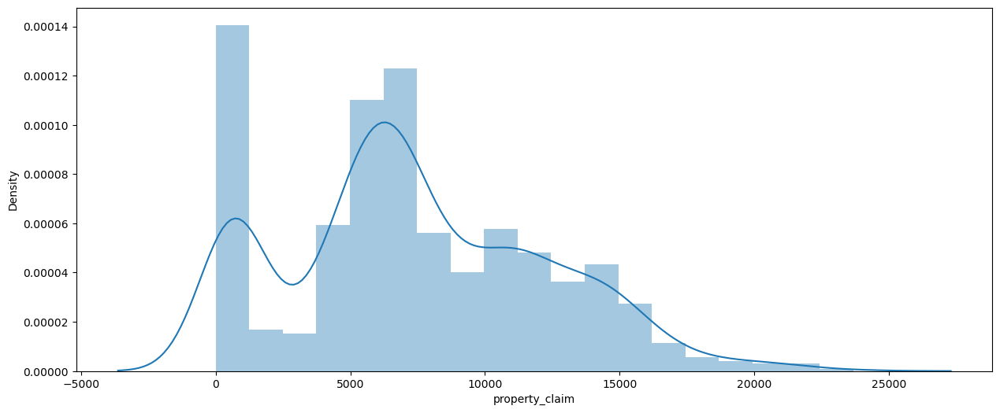

In [56]:
plt.figure(figsize = (15,6))
sns.distplot(df['property_claim'])

We see that mostbof the values are for 0 and between 5000 to 7000.

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13]),
 [Text(0, 0, 'Saab'),
  Text(1, 0, 'Mercedes'),
  Text(2, 0, 'Dodge'),
  Text(3, 0, 'Chevrolet'),
  Text(4, 0, 'Accura'),
  Text(5, 0, 'Nissan'),
  Text(6, 0, 'Audi'),
  Text(7, 0, 'Toyota'),
  Text(8, 0, 'Ford'),
  Text(9, 0, 'Suburu'),
  Text(10, 0, 'BMW'),
  Text(11, 0, 'Jeep'),
  Text(12, 0, 'Honda'),
  Text(13, 0, 'Volkswagen')])

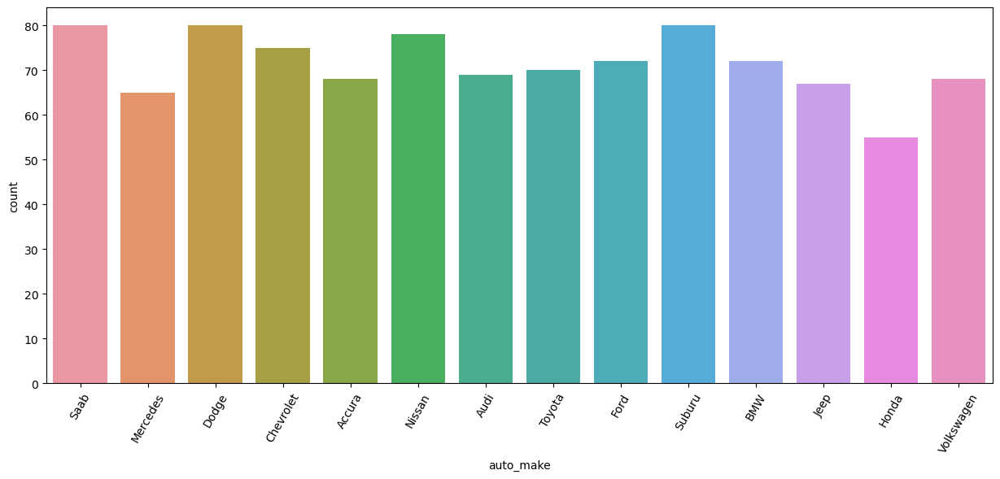

In [57]:
plt.figure(figsize = (15,6))
sns.countplot(df['auto_make'])
plt.xticks(rotation = 60)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38]),
 [Text(0, 0, '92x'),
  Text(1, 0, 'E400'),
  Text(2, 0, 'RAM'),
  Text(3, 0, 'Tahoe'),
  Text(4, 0, 'RSX'),
  Text(5, 0, '95'),
  Text(6, 0, 'Pathfinder'),
  Text(7, 0, 'A5'),
  Text(8, 0, 'Camry'),
  Text(9, 0, 'F150'),
  Text(10, 0, 'A3'),
  Text(11, 0, 'Highlander'),
  Text(12, 0, 'Neon'),
  Text(13, 0, 'MDX'),
  Text(14, 0, 'Maxima'),
  Text(15, 0, 'Legacy'),
  Text(16, 0, 'TL'),
  Text(17, 0, 'Impreza'),
  Text(18, 0, 'Forrestor'),
  Text(19, 0, 'Escape'),
  Text(20, 0, 'Corolla'),
  Text(21, 0, '3 Series'),
  Text(22, 0, 'C300'),
  Text(23, 0, 'Wrangler'),
  Text(24, 0, 'M5'),
  Text(25, 0, 'X5'),
  Text(26, 0, 'Civic'),
  Text(27, 0, 'Passat'),
  Text(28, 0, 'Silverado'),
  Text(29, 0, 'CRV'),
  Text(30, 0, '93'),
  Text(31, 0, 'Accord'),
  Text(32, 0, 'X6'),
  Text(33, 0, 'Malibu'),
  Text(34, 0, 'F

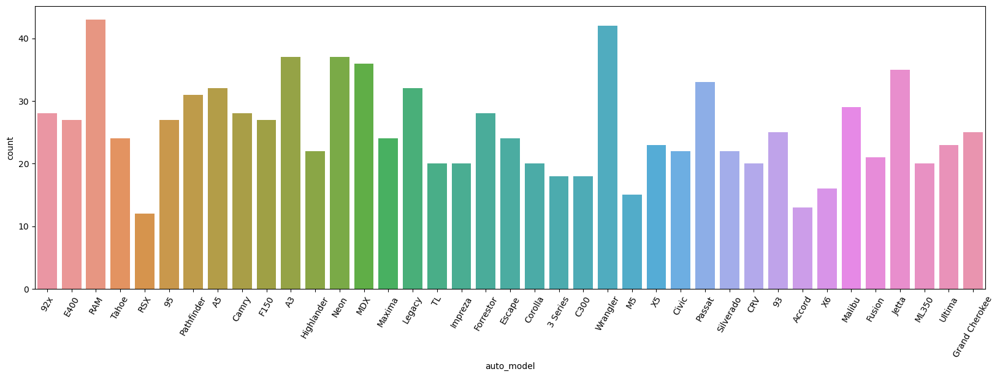

In [60]:
plt.figure(figsize = (20,6))
sns.countplot(df['auto_model'])
plt.xticks(rotation = 60)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20]),
 [Text(0, 0, '1995'),
  Text(1, 0, '1996'),
  Text(2, 0, '1997'),
  Text(3, 0, '1998'),
  Text(4, 0, '1999'),
  Text(5, 0, '2000'),
  Text(6, 0, '2001'),
  Text(7, 0, '2002'),
  Text(8, 0, '2003'),
  Text(9, 0, '2004'),
  Text(10, 0, '2005'),
  Text(11, 0, '2006'),
  Text(12, 0, '2007'),
  Text(13, 0, '2008'),
  Text(14, 0, '2009'),
  Text(15, 0, '2010'),
  Text(16, 0, '2011'),
  Text(17, 0, '2012'),
  Text(18, 0, '2013'),
  Text(19, 0, '2014'),
  Text(20, 0, '2015')])

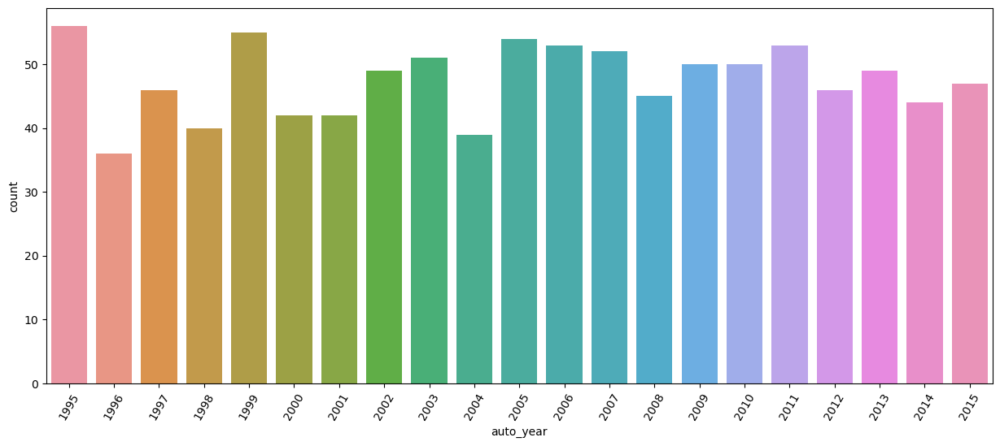

In [59]:
plt.figure(figsize = (15,6))
sns.countplot(df['auto_year'])
plt.xticks(rotation = 60)

<AxesSubplot:xlabel='fraud_reported', ylabel='total_claim_amount'>

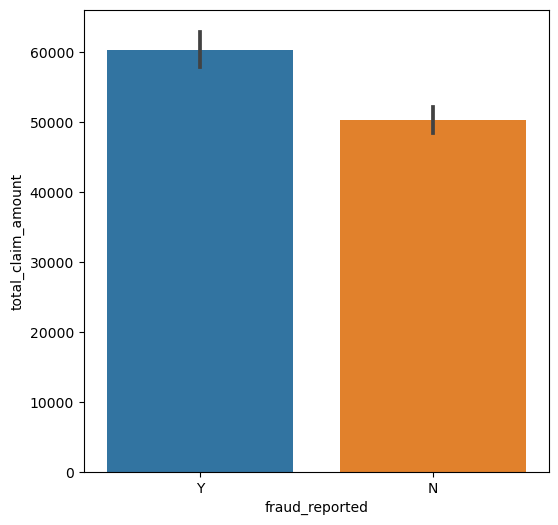

In [62]:
plt.figure(figsize=(6, 6))
sns.barplot(y='total_claim_amount',x='fraud_reported',data=df)

<AxesSubplot:xlabel='number_of_vehicles_involved', ylabel='count'>

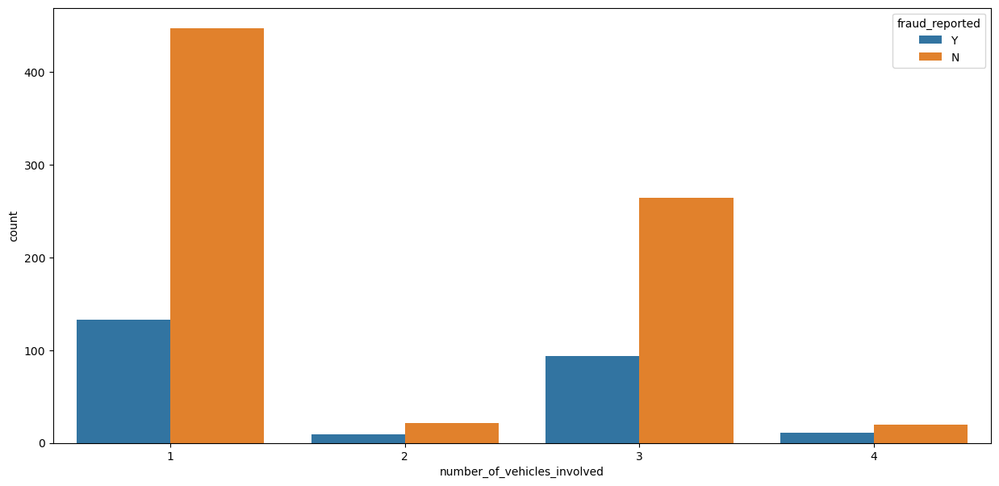

In [63]:
plt.figure(figsize=(15, 7))
sns.countplot(x='number_of_vehicles_involved',hue='fraud_reported',data=df)

<AxesSubplot:xlabel='incident_city', ylabel='count'>

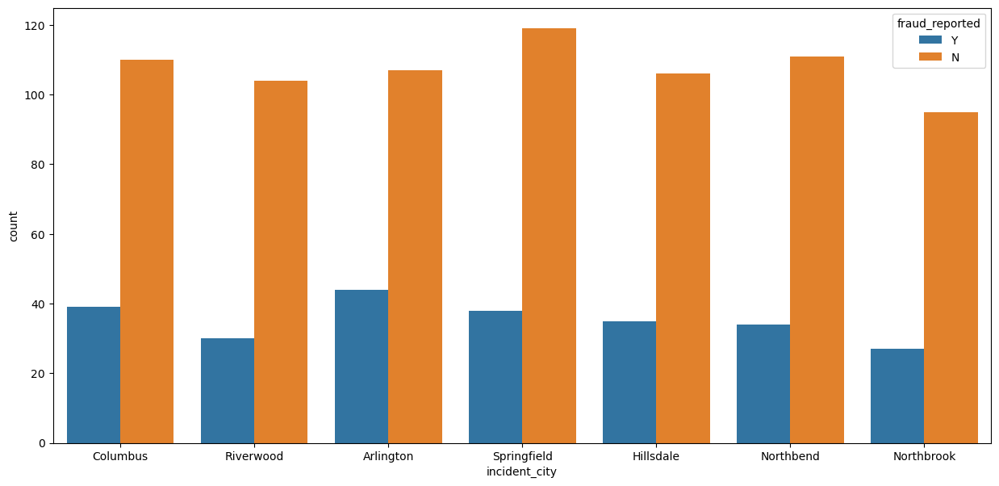

In [64]:
plt.figure(figsize=(15, 7))
sns.countplot(x='incident_city',hue='fraud_reported',data=df)

<AxesSubplot:xlabel='incident_state', ylabel='count'>

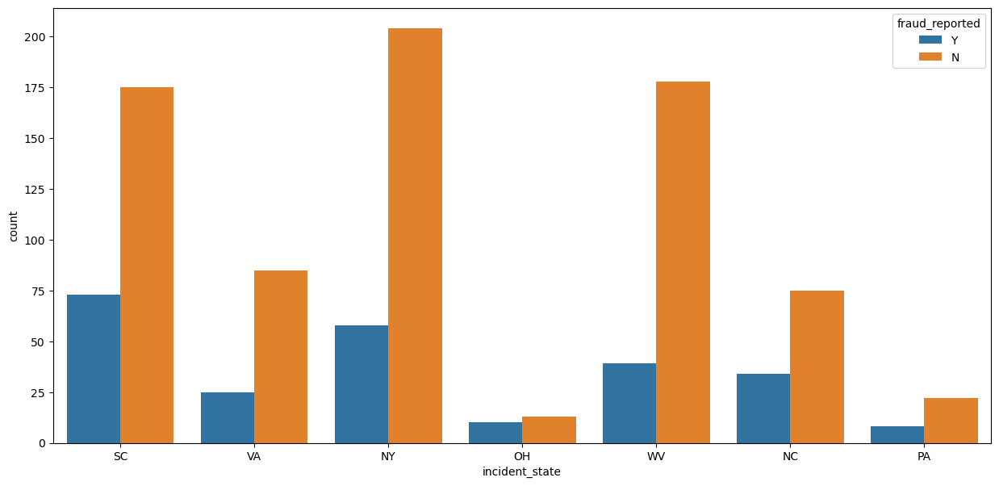

In [65]:
plt.figure(figsize=(15, 7))
sns.countplot(x='incident_state',hue='fraud_reported',data=df)

<AxesSubplot:xlabel='incident_severity', ylabel='count'>

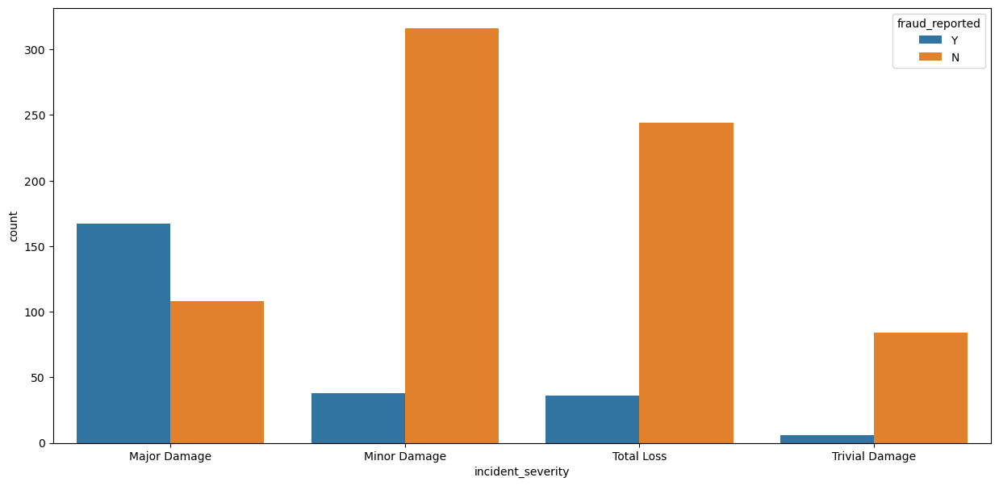

In [66]:
plt.figure(figsize=(15, 7))
sns.countplot(x='incident_severity',hue='fraud_reported',data=df)

<AxesSubplot:xlabel='collision_type', ylabel='count'>

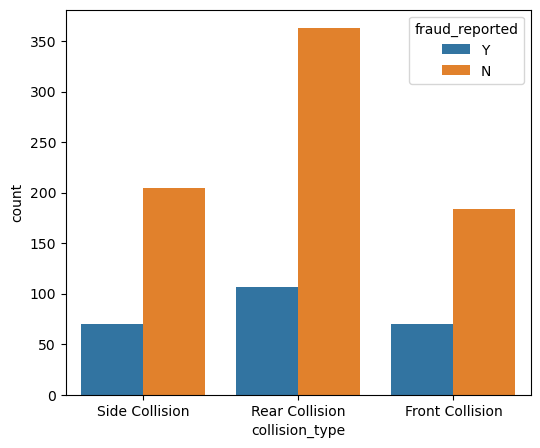

In [68]:
plt.figure(figsize=(6,5))
sns.countplot(x='collision_type',hue='fraud_reported',data=df)

<AxesSubplot:xlabel='incident_type', ylabel='count'>

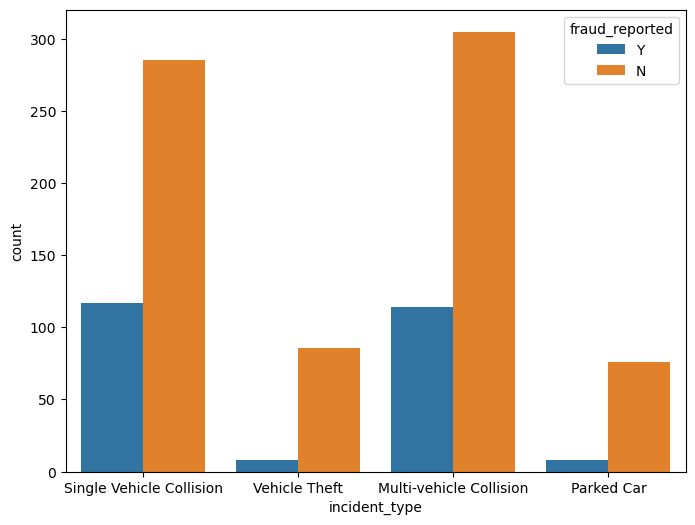

In [69]:
plt.figure(figsize=(8,6))
sns.countplot(x='incident_type',hue='fraud_reported',data=df)

<AxesSubplot:xlabel='incident_date', ylabel='count'>

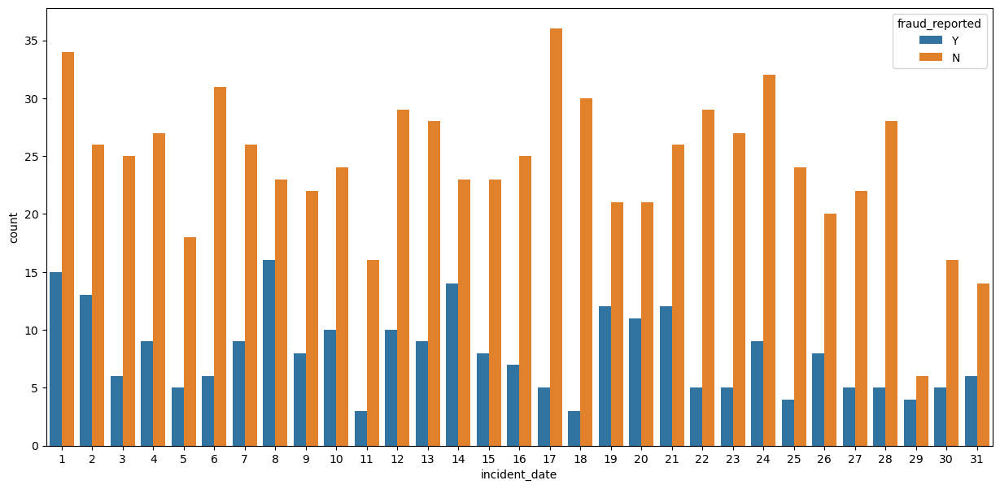

In [70]:
plt.figure(figsize=(15, 7))
sns.countplot(x='incident_date',hue='fraud_reported',data=df)

<AxesSubplot:xlabel='incident_month', ylabel='count'>

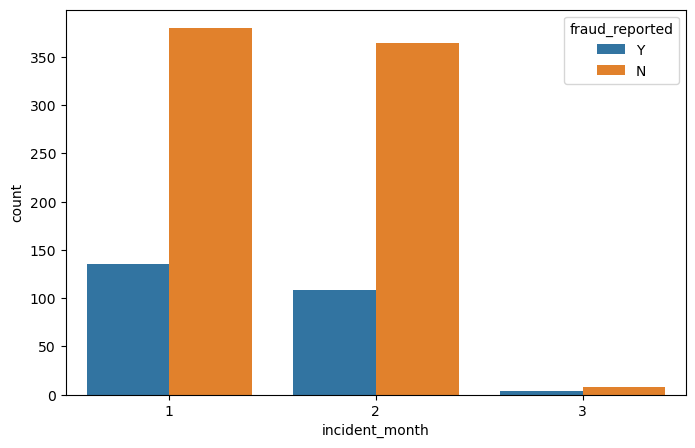

In [72]:
plt.figure(figsize=(8,5))
sns.countplot(x='incident_month',hue='fraud_reported',data=df)

<AxesSubplot:xlabel='insured_sex', ylabel='count'>

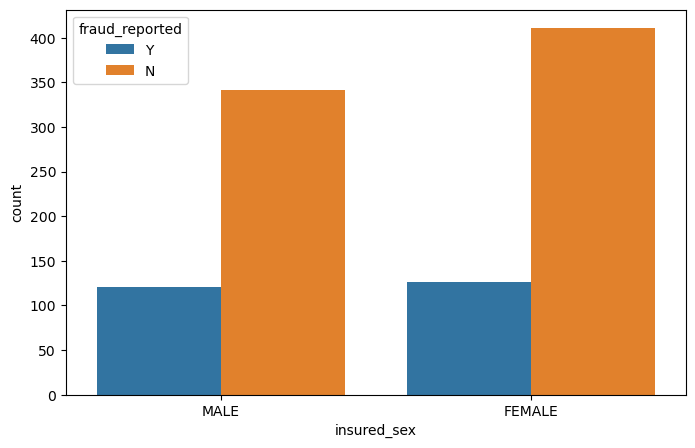

In [80]:
plt.figure(figsize=(8,5))
sns.countplot(x='insured_sex',hue='fraud_reported',data=df)

<AxesSubplot:xlabel='insured_relationship', ylabel='count'>

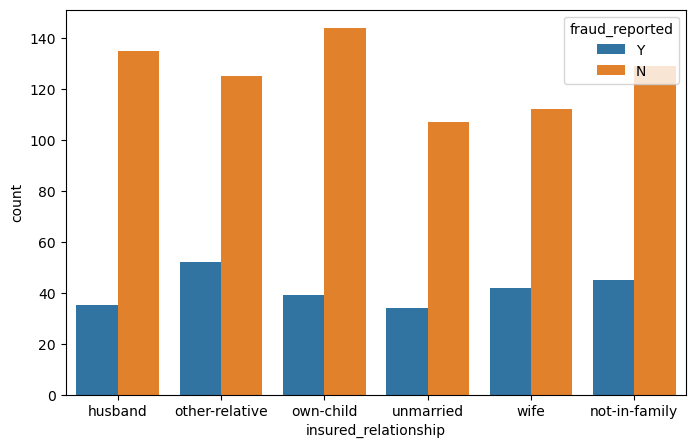

In [81]:
plt.figure(figsize=(8,5))
sns.countplot(x='insured_relationship',hue='fraud_reported',data=df)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19]),
 [Text(0, 0, 'sleeping'),
  Text(1, 0, 'reading'),
  Text(2, 0, 'board-games'),
  Text(3, 0, 'bungie-jumping'),
  Text(4, 0, 'base-jumping'),
  Text(5, 0, 'golf'),
  Text(6, 0, 'camping'),
  Text(7, 0, 'dancing'),
  Text(8, 0, 'skydiving'),
  Text(9, 0, 'movies'),
  Text(10, 0, 'hiking'),
  Text(11, 0, 'yachting'),
  Text(12, 0, 'paintball'),
  Text(13, 0, 'chess'),
  Text(14, 0, 'kayaking'),
  Text(15, 0, 'polo'),
  Text(16, 0, 'basketball'),
  Text(17, 0, 'video-games'),
  Text(18, 0, 'cross-fit'),
  Text(19, 0, 'exercise')])

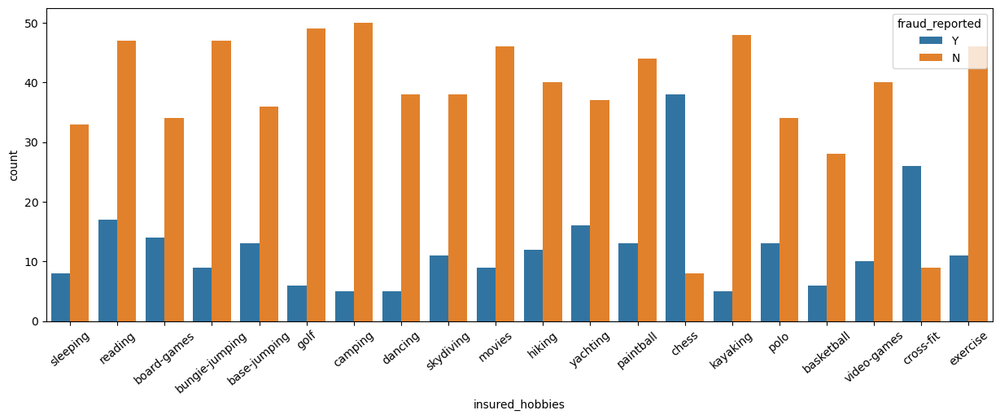

In [83]:
plt.figure(figsize=(15,5))
sns.countplot(x='insured_hobbies',hue='fraud_reported',data=df)
plt.xticks(rotation = 40)

<AxesSubplot:xlabel='fraud_reported', ylabel='property_claim'>

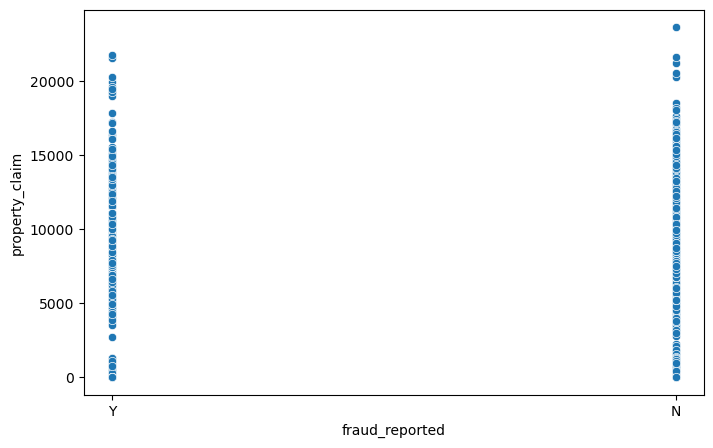

In [87]:
plt.figure(figsize=(8,5))
sns.scatterplot(y='property_claim',x='fraud_reported',  data=df)

<AxesSubplot:xlabel='fraud_reported', ylabel='injury_claim'>

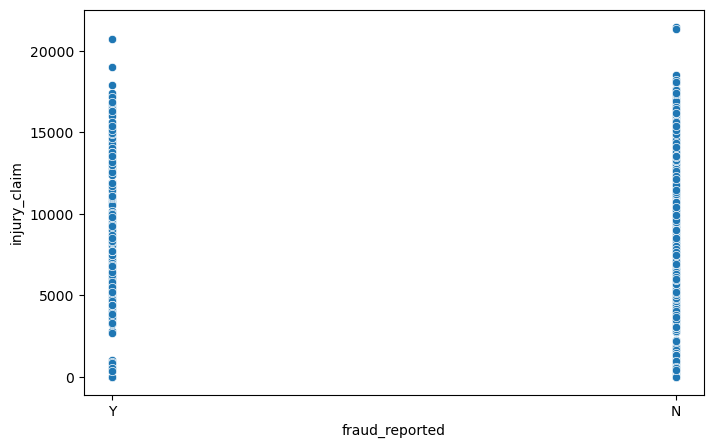

In [88]:
plt.figure(figsize=(8,5))
sns.scatterplot(y='injury_claim',x='fraud_reported',data=df)

<AxesSubplot:xlabel='fraud_reported', ylabel='policy_annual_premium'>

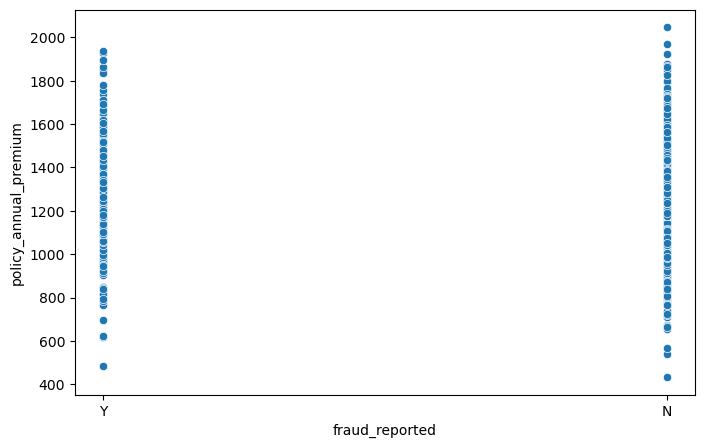

In [89]:
plt.figure(figsize=(8,5))
sns.scatterplot(y='policy_annual_premium',x='fraud_reported',data=df)

<AxesSubplot:xlabel='policy_csl', ylabel='count'>

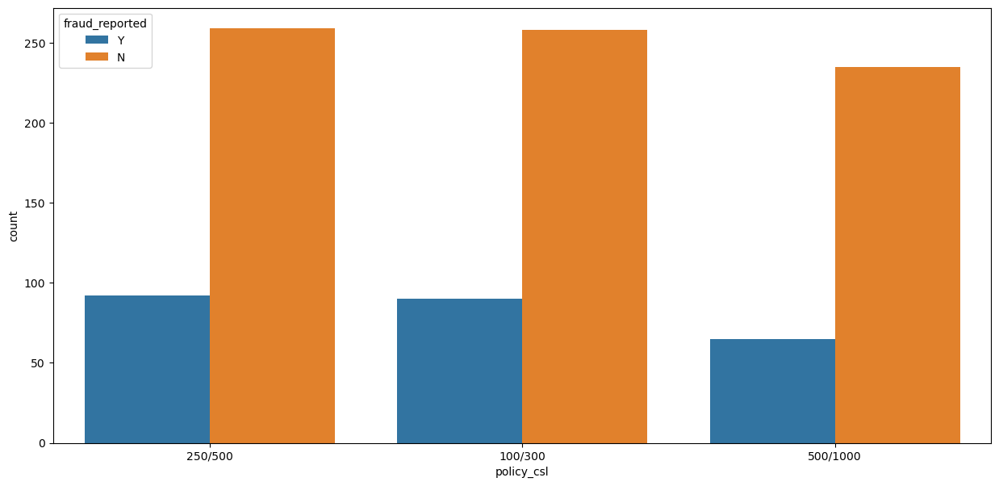

In [90]:
plt.figure(figsize=(15, 7))
sns.countplot(x='policy_csl',hue='fraud_reported',data= df )

<AxesSubplot:xlabel='policy_state', ylabel='count'>

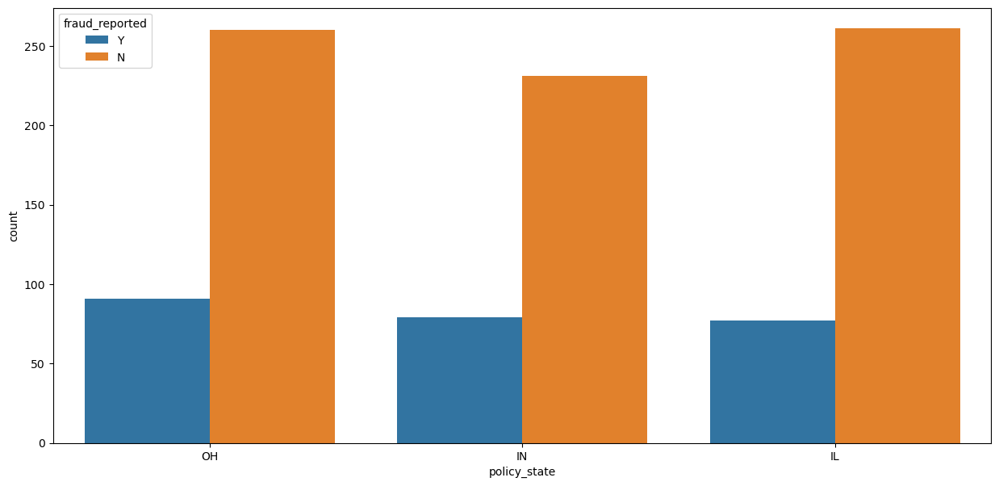

In [91]:
plt.figure(figsize=(15, 7))
sns.countplot(x='policy_state',hue='fraud_reported',data=df)

<AxesSubplot:xlabel='policy_bind_year', ylabel='count'>

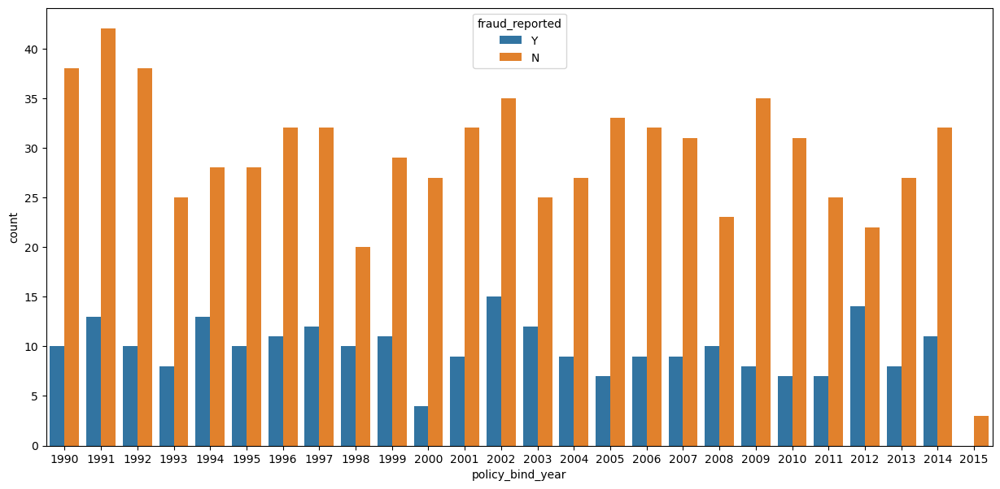

In [96]:
plt.figure(figsize=(15, 7))
sns.countplot(x='policy_bind_year',hue='fraud_reported',data=df)

<AxesSubplot:xlabel='auto_year', ylabel='count'>

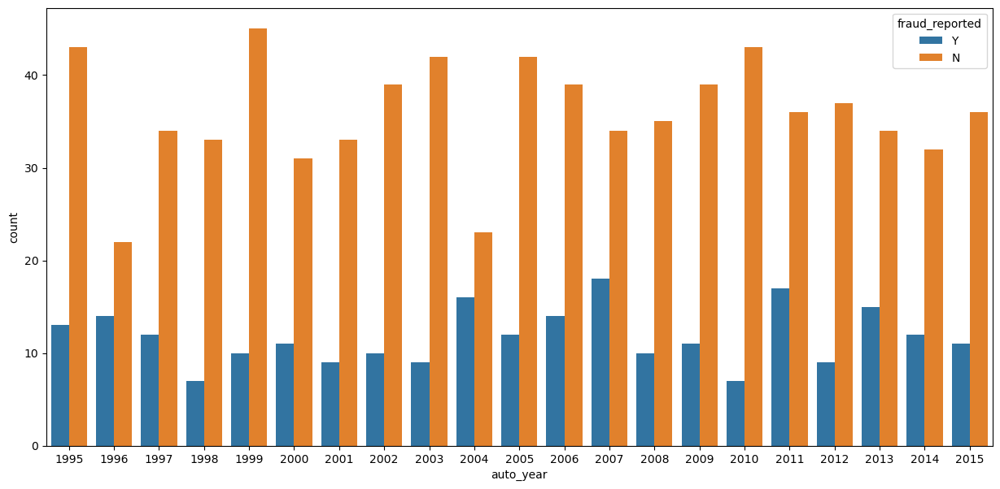

In [97]:
plt.figure(figsize=(15, 7))
sns.countplot(x='auto_year',hue='fraud_reported',data=df)

<AxesSubplot:xlabel='auto_make', ylabel='count'>

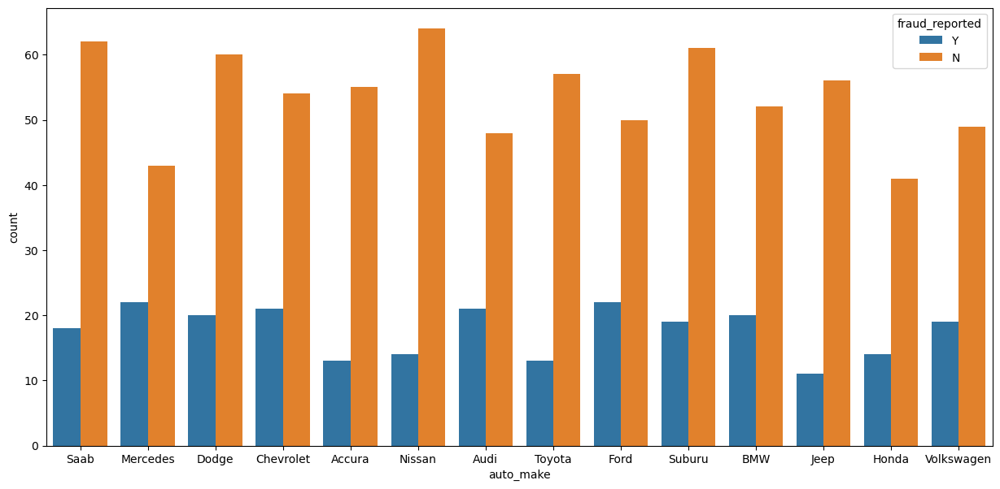

In [98]:
plt.figure(figsize=(15, 7))
sns.countplot(x='auto_make',hue='fraud_reported',data=df)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38]),
 [Text(0, 0, '92x'),
  Text(1, 0, 'E400'),
  Text(2, 0, 'RAM'),
  Text(3, 0, 'Tahoe'),
  Text(4, 0, 'RSX'),
  Text(5, 0, '95'),
  Text(6, 0, 'Pathfinder'),
  Text(7, 0, 'A5'),
  Text(8, 0, 'Camry'),
  Text(9, 0, 'F150'),
  Text(10, 0, 'A3'),
  Text(11, 0, 'Highlander'),
  Text(12, 0, 'Neon'),
  Text(13, 0, 'MDX'),
  Text(14, 0, 'Maxima'),
  Text(15, 0, 'Legacy'),
  Text(16, 0, 'TL'),
  Text(17, 0, 'Impreza'),
  Text(18, 0, 'Forrestor'),
  Text(19, 0, 'Escape'),
  Text(20, 0, 'Corolla'),
  Text(21, 0, '3 Series'),
  Text(22, 0, 'C300'),
  Text(23, 0, 'Wrangler'),
  Text(24, 0, 'M5'),
  Text(25, 0, 'X5'),
  Text(26, 0, 'Civic'),
  Text(27, 0, 'Passat'),
  Text(28, 0, 'Silverado'),
  Text(29, 0, 'CRV'),
  Text(30, 0, '93'),
  Text(31, 0, 'Accord'),
  Text(32, 0, 'X6'),
  Text(33, 0, 'Malibu'),
  Text(34, 0, 'F

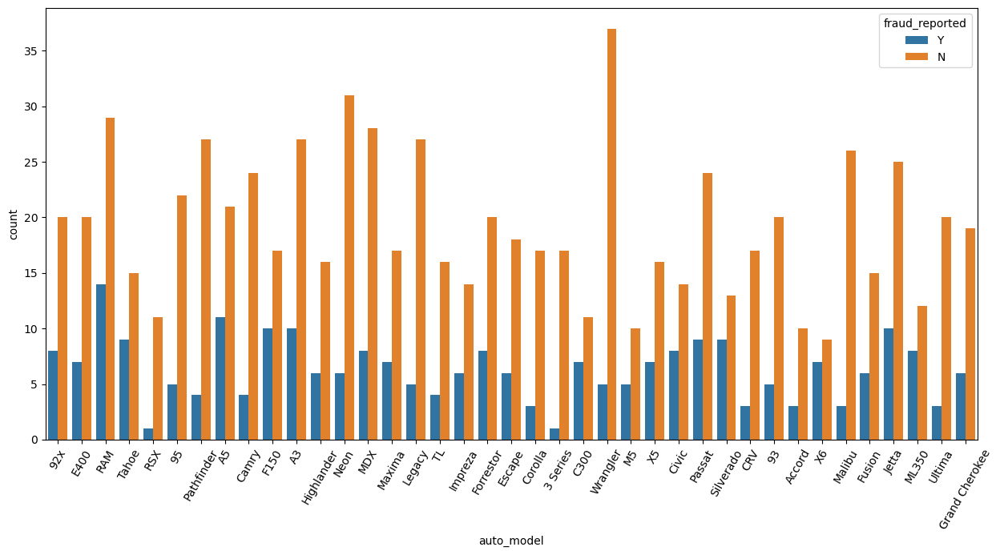

In [100]:
plt.figure(figsize=(15, 7))
sns.countplot(x='auto_model',hue='fraud_reported',data=df)
plt.xticks(rotation = 60)

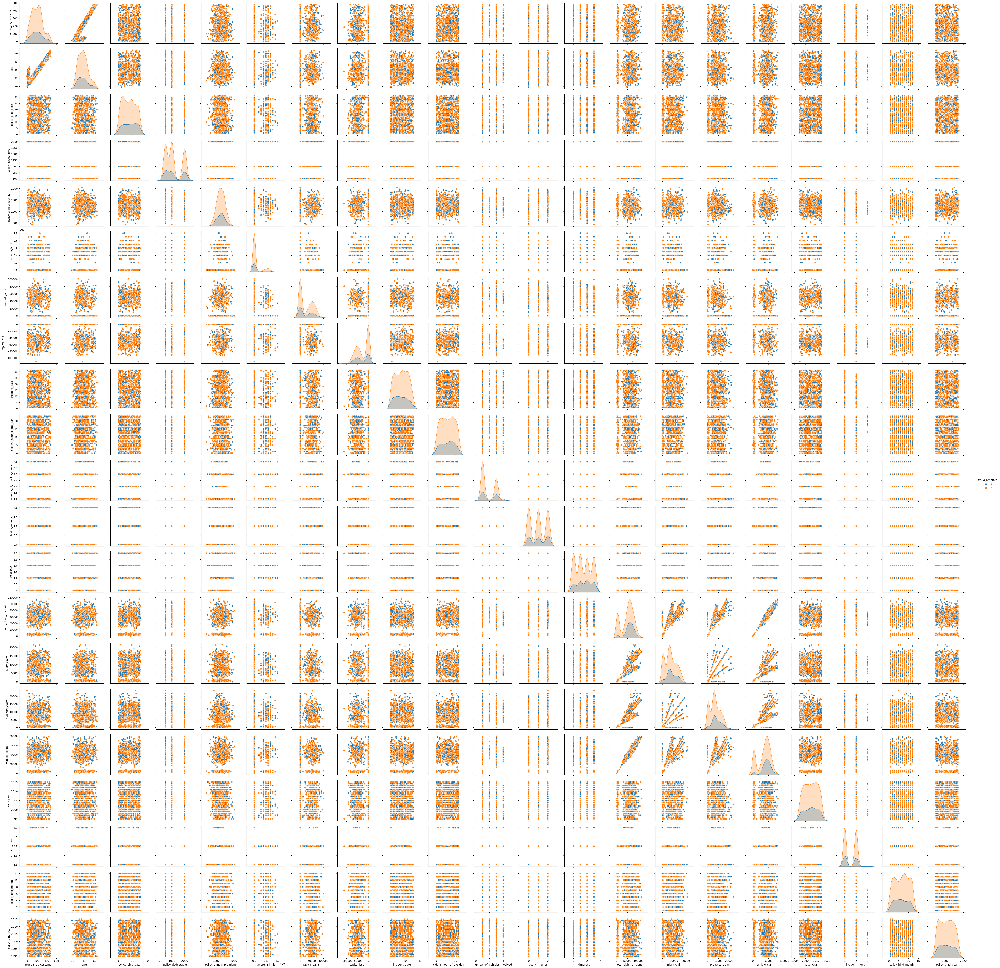

In [102]:
sns.pairplot(df,hue= 'fraud_reported')

In [104]:
df.dtypes

months_as_customer               int64
age                              int64
policy_bind_date                 int32
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                    int32
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_hour_of_the_day         int64
number_of_vehicles_involved      int64
property_damage                 object
bodily_injuries          

In [105]:
categorical=[]
numerical = []
for i in df.dtypes.index:
    if df.dtypes[i]=='object':
        categorical.append(i)
    else:
        numerical.append(i)
print('Categorical Columns are: ', categorical)
print('Numerical Columns are: ', numerical)

Categorical Columns are:  ['policy_state', 'policy_csl', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported']
Numerical Columns are:  ['months_as_customer', 'age', 'policy_bind_date', 'policy_deductable', 'policy_annual_premium', 'umbrella_limit', 'capital-gains', 'capital-loss', 'incident_date', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'auto_year', 'incident_month', 'policy_bind_month', 'policy_bind_year']


### Check For Outliers

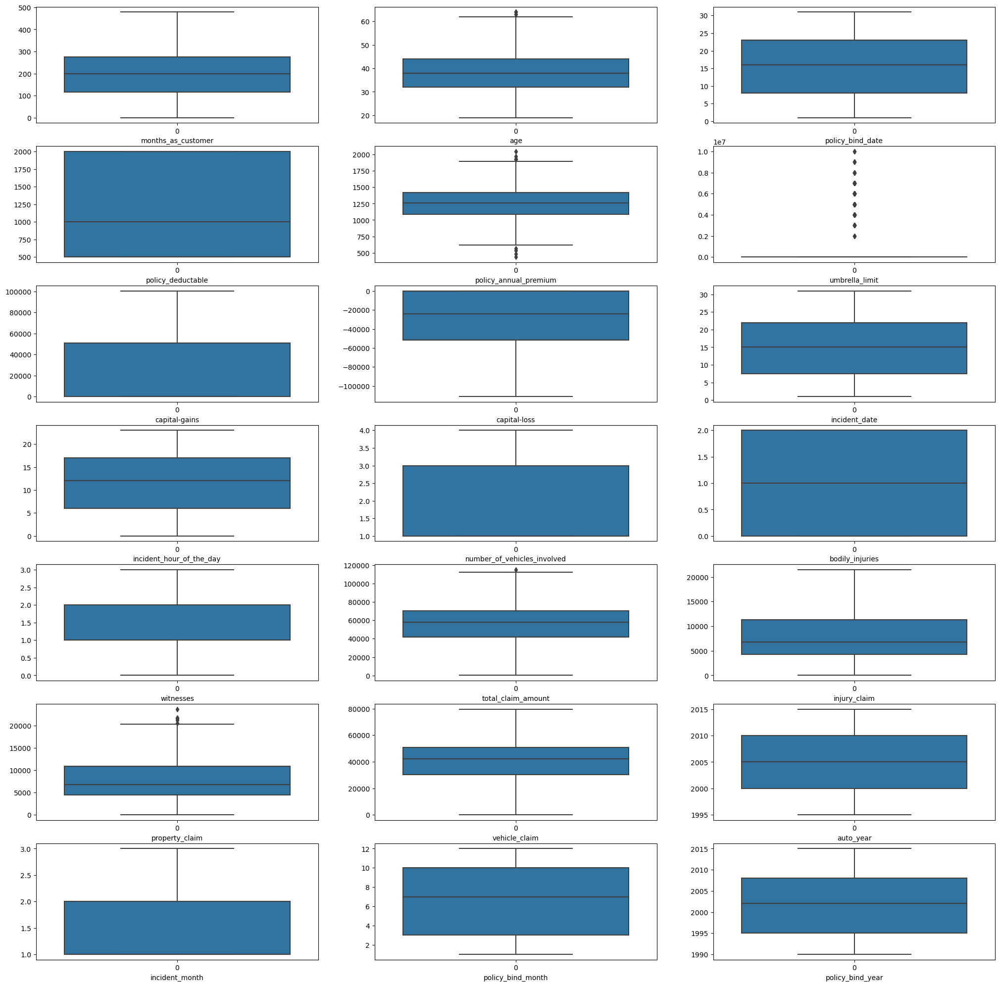

In [108]:
plt.figure(figsize =(25,25), facecolor = 'white')
num = 1
for column in numerical:
    if num <=21:
        plt.subplot(7,3,num)
        sns.boxplot(data = df[column])
        plt.xlabel(column,fontsize = 10)
        
    num +=1
plt.show()


In [111]:
outliers = df[['age','policy_annual_premium','umbrella_limit','total_claim_amount','property_claim']]

In [112]:
#using z_score Method
from scipy.stats import zscore
z = np.abs(zscore(outliers))
np.where(z>3) #threshold = 3
z_df=df[(z<3).all(axis=1)]
print(z_df.shape)
print("data_loss =   ", ((df.shape[0]-z_df.shape[0])/df.shape[0])*100)

(980, 39)
data_loss =    1.9019019019019021


In [113]:
#Using Iqr Method
q1 = outliers.quantile(0.25)
q3 = outliers.quantile(0.75)

iqr = q3-q1

iqr_df = df[~((df <(q1 - 1.5*iqr))| (df>(q3+1.5*iqr))).any(axis=1)]
print(iqr_df.shape)
print("data_loss =   ", ((df.shape[0]-iqr_df.shape[0])/df.shape[0])*100)

(782, 39)
data_loss =    21.72172172172172


We see there is a huge data loss using IQR method i.e., 21.72%. By z_score method we are losing 1.90% of data. So we consider z_Score method as best method to remove outliers and we consider z_df for next steps..

In [114]:
z_df.skew()

months_as_customer             0.365125
age                            0.476754
policy_bind_date               0.050984
policy_deductable              0.471943
policy_annual_premium          0.035865
umbrella_limit                 1.802554
capital-gains                  0.464317
capital-loss                  -0.388777
incident_date                  0.039604
incident_hour_of_the_day      -0.037554
number_of_vehicles_involved    0.505303
bodily_injuries                0.000000
witnesses                      0.023314
total_claim_amount            -0.596371
injury_claim                   0.270023
property_claim                 0.358650
vehicle_claim                 -0.624140
auto_year                     -0.055278
incident_month                 0.255831
policy_bind_month             -0.030682
policy_bind_year               0.061023
dtype: float64

In [115]:
from scipy.stats import yeojohnson, boxcox
z_df['umbrella_limit'] = yeojohnson(z_df['umbrella_limit'])[0]
z_df['vehicle_claim'] = yeojohnson(z_df['vehicle_claim'])[0]
z_df.skew()

months_as_customer             0.365125
age                            0.476754
policy_bind_date               0.050984
policy_deductable              0.471943
policy_annual_premium          0.035865
umbrella_limit                 1.584538
capital-gains                  0.464317
capital-loss                  -0.388777
incident_date                  0.039604
incident_hour_of_the_day      -0.037554
number_of_vehicles_involved    0.505303
bodily_injuries                0.000000
witnesses                      0.023314
total_claim_amount            -0.596371
injury_claim                   0.270023
property_claim                 0.358650
vehicle_claim                 -0.523109
auto_year                     -0.055278
incident_month                 0.255831
policy_bind_month             -0.030682
policy_bind_year               0.061023
dtype: float64

In [124]:
z_df

,months_as_customer,age,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,...,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,incident_month,policy_bind_month,policy_bind_year
0,328,48,17,OH,250/500,1000,1406.91,-0.000000,MALE,MD,...,6510,13020,126816.728498,Saab,92x,2004,Y,1,10,2014
1,228,42,27,IN,250/500,2000,1197.22,0.804064,MALE,MD,...,780,780,6708.342112,Mercedes,E400,2007,Y,1,6,2006
2,134,29,6,OH,100/300,2000,1413.14,0.804064,FEMALE,PhD,...,7700,3850,52287.287803,Dodge,RAM,2007,N,2,9,2000
3,256,41,25,IL,250/500,2000,1415.74,0.804065,FEMALE,PhD,...,6340,6340,123211.782070,Chevrolet,Tahoe,2014,Y,1,5,1990
4,228,44,6,IL,500/1000,1000,1583.91,0.804065,MALE,Associate,...,1300,650,8900.854363,Accura,RSX,2009,N,2,6,2014
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,16,OH,500/1000,1000,1310.80,-0.000000,FEMALE,Masters,...,17440,8720,150770.026392,Honda,Accord,2006,N,2,7,1991
996,285,41,5,IL,100/300,1000,1436.79,-0.000000,FEMALE,PhD,...,18080,18080,181374.528533,Volkswagen,Passat,2015,N,1,1,2014
997,130,34,17,OH,250/500,500,1383.49,0.804061,FEMALE,Masters,...,7500,7500,127931.742011,Suburu,Impreza,1996,N,1,2,2003
998,458,62,18,IL,500/1000,2000,1356.92,0.804064,MALE,Associate,...,5220,5220,86187.790014,Audi,A5,1998,N,2,11,2011


#### Label Encoding

In [125]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for i in z_df.columns:
    if z_df[i].dtypes == 'object':
        z_df[i] = le.fit_transform(z_df[i])
z_df

,months_as_customer,age,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,...,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,incident_month,policy_bind_month,policy_bind_year
0,328,48,17,2,1,1000,1406.91,-0.000000,1,4,...,6510,13020,126816.728498,10,1,2004,1,1,10,2014
1,228,42,27,1,1,2000,1197.22,0.804064,1,4,...,780,780,6708.342112,8,12,2007,1,1,6,2006
2,134,29,6,2,0,2000,1413.14,0.804064,0,6,...,7700,3850,52287.287803,4,30,2007,0,2,9,2000
3,256,41,25,0,1,2000,1415.74,0.804065,0,6,...,6340,6340,123211.782070,3,34,2014,1,1,5,1990
4,228,44,6,0,2,1000,1583.91,0.804065,1,0,...,1300,650,8900.854363,0,31,2009,0,2,6,2014
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,16,2,2,1000,1310.80,-0.000000,0,5,...,17440,8720,150770.026392,6,6,2006,0,2,7,1991
996,285,41,5,0,0,1000,1436.79,-0.000000,0,6,...,18080,18080,181374.528533,13,28,2015,0,1,1,2014
997,130,34,17,2,1,500,1383.49,0.804061,0,5,...,7500,7500,127931.742011,11,19,1996,0,1,2,2003
998,458,62,18,0,2,2000,1356.92,0.804064,1,0,...,5220,5220,86187.790014,1,5,1998,0,2,11,2011


In [126]:
df = z_df

In [129]:
df.corr()

,months_as_customer,age,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,...,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,incident_month,policy_bind_month,policy_bind_year
months_as_customer,1.000000,0.923003,0.055943,-0.008016,-2.105849e-02,0.031536,-0.004113,4.524445e-03,0.059065,0.000331,...,0.064719,0.035126,0.055165,0.050566,0.004988,0.002213,0.021784,-4.756198e-02,-0.006782,-0.041442
age,0.923003,1.000000,0.057636,-0.020422,-1.294345e-02,0.032222,0.005177,-4.622576e-03,0.073543,0.002158,...,0.076931,0.061680,0.058577,0.034187,0.015284,0.006286,0.013533,-3.840599e-02,0.003611,-0.031505
policy_bind_date,0.055943,0.057636,1.000000,0.013045,3.321585e-03,0.003716,-0.040999,-2.022501e-02,0.046166,0.044320,...,0.015310,0.004269,0.006320,-0.023595,0.005092,0.030383,0.062266,5.188657e-03,0.029219,0.007756
policy_state,-0.008016,-0.020422,0.013045,1.000000,3.072424e-03,0.018840,0.014684,-5.037268e-03,-0.019288,-0.025395,...,-0.048503,-0.008913,-0.008481,0.011361,-0.018596,0.000712,0.035312,1.760564e-02,0.041655,-0.001997
policy_csl,-0.021058,-0.012943,0.003322,0.003072,1.000000e+00,0.008757,0.033107,9.288635e-03,-0.002182,0.006531,...,-0.079770,-0.040458,-0.040710,-0.010554,0.043429,-0.032323,-0.033254,-2.907506e-02,-0.018497,-0.020433
policy_deductable,0.031536,0.032222,0.003716,0.018840,8.756573e-03,1.000000,-0.007400,-1.329214e-03,-0.007173,0.012524,...,0.040104,0.074757,0.007535,-0.030935,-0.004007,0.026504,0.014340,-3.505104e-02,-0.026870,-0.053712
policy_annual_premium,-0.004113,0.005177,-0.040999,0.014684,3.310664e-02,-0.007400,1.000000,-5.944869e-03,0.040594,-0.020895,...,-0.023807,-0.014403,0.008843,0.009084,-0.038893,-0.042554,-0.012707,-4.760015e-02,-0.007040,0.003071
umbrella_limit,0.004524,-0.004623,-0.020225,-0.005037,9.288635e-03,-0.001329,-0.005945,1.000000e+00,0.019007,-0.023980,...,-0.041555,-0.012977,-0.038881,0.018390,0.012455,0.015721,0.051126,4.469657e-08,-0.034639,0.058959
insured_sex,0.059065,0.073543,0.046166,-0.019288,-2.181707e-03,-0.007173,0.040594,1.900713e-02,1.000000,0.011724,...,0.007267,-0.011965,-0.026073,0.022272,-0.017909,-0.030066,0.021751,-2.538428e-02,0.001355,-0.031088
insured_education_level,0.000331,0.002158,0.044320,-0.025395,6.530955e-03,0.012524,-0.020895,-2.397986e-02,0.011724,1.000000,...,0.087040,0.065575,0.075463,0.058679,0.043523,0.052100,0.012238,-5.241455e-02,-0.081043,0.015535


In [128]:
df.corr().sum()

months_as_customer             2.241214
age                            2.325380
policy_bind_date               1.246962
policy_state                   1.082916
policy_csl                     0.839349
policy_deductable              1.085300
policy_annual_premium          1.122095
umbrella_limit                 0.849641
insured_sex                    1.116897
insured_education_level        1.267185
insured_occupation             0.872625
insured_hobbies                0.768697
insured_relationship           0.875896
capital-gains                  1.209759
capital-loss                   0.269877
incident_date                  0.720349
incident_type                 -0.934738
collision_type                 1.111620
incident_severity             -0.956255
authorities_contacted          0.558666
incident_state                 0.958793
incident_city                  1.290544
incident_hour_of_the_day       1.823774
number_of_vehicles_involved    1.071202
property_damage                1.048855


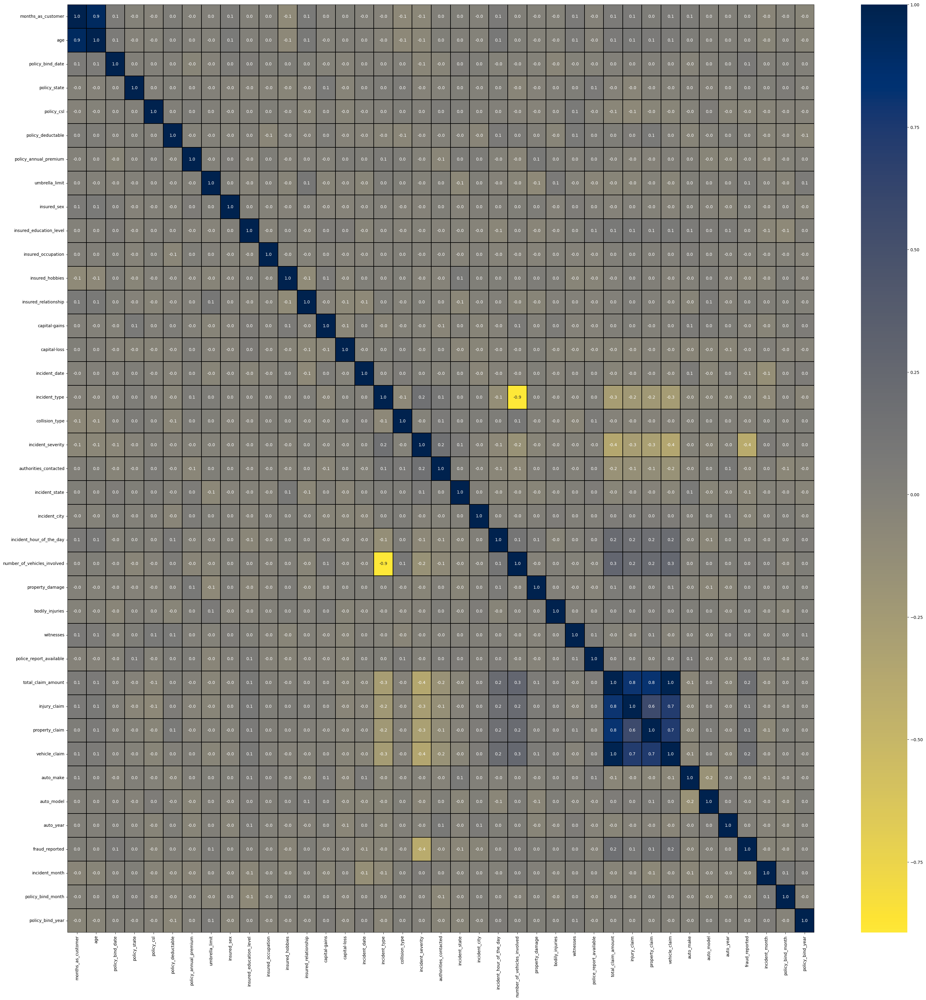

In [134]:
plt.figure(figsize = (40,40))
sns.heatmap(df.corr(), linewidths = 0.1, fmt = '0.1f', linecolor = "Black", annot=True, cmap = 'cividis_r')
plt.show()

We see that
1. 'age' and 'month_as_customer' are highly positively corelated.
2. 'injury claim', 'vehicle_claim', 'Property Claim' and 'total_claim_amount' are highly positively corelated.
3. 'vehicle claim', 'property claim' and 'injury claim' are highly positively corelated.
3. 'vehicle claim' and 'property claim' are highly positively corelated.
4. 'number_of_vehicle_involved' and 'incident severity' are highly negatively correlated. 

In [135]:
df.corr()['fraud_reported'].sort_values()

incident_severity             -0.402746
incident_date                 -0.057443
incident_state                -0.052327
insured_hobbies               -0.047768
authorities_contacted         -0.043636
incident_city                 -0.041146
incident_type                 -0.039804
policy_csl                    -0.033254
policy_bind_month             -0.032348
auto_make                     -0.031899
incident_month                -0.031704
police_report_available       -0.023867
capital-gains                 -0.016651
collision_type                -0.015992
capital-loss                  -0.015242
policy_annual_premium         -0.012707
auto_model                    -0.001727
insured_occupation            -0.000301
auto_year                      0.001248
policy_bind_year               0.002294
incident_hour_of_the_day       0.005321
insured_education_level        0.012238
age                            0.013533
policy_deductable              0.014340
insured_sex                    0.021751


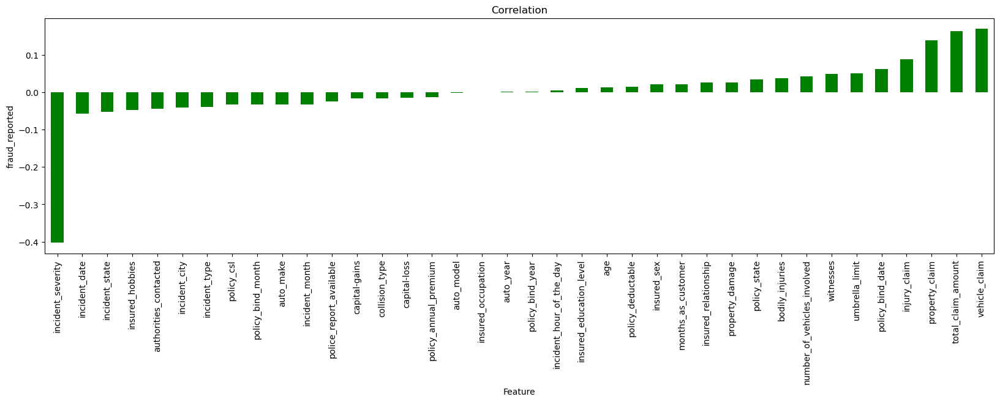

In [136]:
plt.figure(figsize=(20,5))
df.corr()['fraud_reported'].sort_values(ascending=True).drop(['fraud_reported']).plot(kind='bar',color='green')
plt.title('Correlation')
plt.xlabel('Feature')
plt.ylabel('fraud_reported')
plt.show()

We see that insured_occupation, auto_model, auto_year, policy_bind_year are having very least correlation. Vehicle claim has the highest positive relation and incident_severity has the highest negative_correlation.

### Fraud_reported Prediction

In [137]:
x = df.drop(columns = ['fraud_reported'], axis = 1)
y = df['fraud_reported']

In [138]:
x.shape

(980, 38)

In [139]:
y.shape

(980,)

### Standard Scaler

In [140]:
from sklearn.preprocessing import StandardScaler
sr = StandardScaler()
x = pd.DataFrame(sr.fit_transform(x), columns = x.columns)
x

,months_as_customer,age,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,...,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,incident_month,policy_bind_month,policy_bind_year
0,1.070680,0.983845,0.176409,1.181890,0.066009,-0.227044,0.619986,-0.484001,1.074172,0.531957,...,0.719972,-0.188318,1.178894,0.760297,0.851976,-1.637178,-0.188373,-0.954348,0.971626,1.681391
1,0.203639,0.330172,1.310052,-0.023367,0.066009,1.409009,-0.248482,2.066112,1.074172,0.531957,...,-1.809731,-1.361133,-1.380126,-1.787870,0.355581,-0.649281,0.310562,-0.954348,-0.169751,0.598494
2,-0.611378,-1.086121,-1.070598,1.181890,-1.178014,1.409009,0.645789,2.066112,-0.930949,1.557164,...,-0.685165,0.055251,-0.738280,-0.820887,-0.637209,0.967278,0.310562,0.954348,0.686282,-0.213679
3,0.446411,0.221226,1.083323,-1.228624,0.066009,1.409009,0.656557,2.066114,-0.930949,1.557164,...,0.407846,-0.223113,-0.217695,0.683816,-0.885407,1.326513,1.474744,-0.954348,-0.455095,-1.567300
4,0.203639,0.548063,-1.070598,-1.228624,1.310033,-0.227044,1.353062,2.066114,1.074172,-1.518458,...,-1.755365,-1.254699,-1.407305,-1.741354,-1.630000,1.057086,0.643185,0.954348,-0.169751,1.681391
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
975,-1.747201,-0.105611,0.063044,1.181890,1.310033,-0.227044,0.221930,-0.484001,-0.930949,1.044561,...,1.312669,2.048832,0.279892,1.268480,-0.140814,-1.188134,0.144250,0.954348,0.115593,-1.431938
976,0.697852,0.221226,-1.183963,-1.228624,-1.178014,-0.227044,0.743739,-0.484001,-0.930949,1.557164,...,2.121687,2.179827,2.236789,1.917771,1.596569,0.787660,1.641055,-0.954348,-1.596471,1.681391
977,-0.646060,-0.541393,0.176409,1.181890,0.066009,-1.045071,0.522988,2.066103,-0.930949,1.044561,...,0.563719,0.014315,0.024826,0.783953,1.100174,-0.020619,-1.518867,-0.954348,-1.311127,0.192408
978,2.197832,2.509083,0.289773,-1.228624,1.310033,1.409009,0.412944,2.066112,1.074172,-1.518458,...,-0.216406,-0.452355,-0.451854,-0.101669,-1.381802,-1.277943,-1.186244,0.954348,1.256970,1.275305


Now we have scaled the data. next we will go with Multicollinearity.

### Variance_inflation_factor

In [141]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['VIF Values']=[variance_inflation_factor(x.values, i) for i in range(len(x.columns))]
vif['Features'] = x.columns

vif

,VIF Values,Features
0,6.925400,months_as_customer
1,6.932811,age
2,1.025915,policy_bind_date
3,1.031050,policy_state
4,1.031086,policy_csl
5,1.045978,policy_deductable
6,1.038661,policy_annual_premium
7,1.045457,umbrella_limit
8,1.028372,insured_sex
9,1.053879,insured_education_level


We see that total_claim_amount and Vehicle_claim are having higher vif values so we will drop these columns and check for vif values.

In [142]:
x.drop("total_claim_amount", axis = 1, inplace = True)

In [143]:
vif = pd.DataFrame()
vif['VIF Values']=[variance_inflation_factor(x.values, i) for i in range(len(x.columns))]
vif['Features'] = x.columns

vif

,VIF Values,Features
0,6.925257,months_as_customer
1,6.932184,age
2,1.025678,policy_bind_date
3,1.031008,policy_state
4,1.029722,policy_csl
5,1.045293,policy_deductable
6,1.037629,policy_annual_premium
7,1.045126,umbrella_limit
8,1.028005,insured_sex
9,1.053853,insured_education_level


We see that now all the values are in range. So next we will check for imbalance dataset and then split_train_test models.

In [144]:
y.value_counts()

0    740
1    240
Name: fraud_reported, dtype: int64

We see there is huge data imbalnce so we will go with Oversampling techniques to balance the dataset.

### Oversampling

In [145]:
from imblearn.over_sampling import SMOTE
sm = SMOTE()
x, y = sm.fit_resample(x,y)

In [146]:
y.value_counts()

1    740
0    740
Name: fraud_reported, dtype: int64

Now we see that data is balanced next we will split train test the model.

In [147]:
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.metrics import f1_score, accuracy_score, classification_report, roc_curve, confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, ExtraTreesClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier as KNN
from sklearn.svm import SVC

In [148]:
accuracy = 0
r_state =0
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(x,y, test_size = 0.30, random_state = i)
    log = LogisticRegression()
    log.fit(x_train,y_train)
    y_pred = log.predict(x_test)
    acc = accuracy_score(y_test,y_pred)
    if acc>accuracy:
        accuracy=acc
        r_state = i
print("max accuracy score is ", accuracy , "randomstate = ",r_state)

max accuracy score is  0.7837837837837838 randomstate =  10


In [149]:
x_train,x_test,y_train,y_test = train_test_split(x,y, test_size = 0.30, random_state = 10)

In [150]:
x_train.shape

(1036, 37)

In [151]:
y_train.shape

(1036,)

In [152]:
x_test.shape

(444, 37)

In [153]:
y_test.shape

(444,)

In [154]:
log = LogisticRegression()
log.fit(x_train,y_train)
log_pred = log.predict(x_test)
log_pred_train = log.predict(x_train)
print("Logistic Regression")
print("Accuracy of train data is  ",accuracy_score(y_train, log_pred_train)*100, "%")
log_accu = accuracy_score(y_test, log_pred) 
print("Accuracy of test data is  ", (log_accu)*100 ,"%")
print("\n Confusion Matrix", confusion_matrix(y_test,log_pred))
print('\n Test Classification Report \n', classification_report(y_test,log_pred))
print("****************************************")
print("\n")

rfc = RandomForestClassifier()
rfc.fit(x_train,y_train)
rfc_pred = rfc.predict(x_test)
rfc_pred_train = rfc.predict(x_train)
print("Random Forest Classifier")
print("Accuracy of train data is  ",accuracy_score(y_train, rfc_pred_train)*100, "%")
rfc_accu = accuracy_score(y_test, rfc_pred) 
print("Accuracy of test data is  ", (rfc_accu)*100,"%")
print("\n Confusion Matrix", confusion_matrix(y_test,rfc_pred))
print('\n Test Classification Report \n', classification_report(y_test,rfc_pred))
print("****************************************")
print("\n")

bc = BaggingClassifier()
bc.fit(x_train,y_train)
bc_pred = bc.predict(x_test)
bc_pred_train = bc.predict(x_train)
print("Bagging Classifier")
print("Accuracy of train data is  ",accuracy_score(y_train, bc_pred_train)*100, "%")
bc_accu = accuracy_score(y_test, bc_pred)
print("Accuracy of test data is  ", (bc_accu)*100,"%")
print("\n Confusion Matrix", confusion_matrix(y_test,bc_pred))
print('\n Test Classification Report \n', classification_report(y_test,bc_pred))
print("****************************************")
print("\n")

abc = AdaBoostClassifier()
abc.fit(x_train,y_train)
abc_pred = abc.predict(x_test)
abc_pred_train = abc.predict(x_train)
print("AdaBoost Classifier")
print("Accuracy of train data is  ",accuracy_score(y_train, abc_pred_train)*100, "%")
abc_accu = accuracy_score(y_test, abc_pred)
print("Accuracy of test data is  ", (abc_accu) *100 ,"%")
print("\n Confusion Matrix", confusion_matrix(y_test,abc_pred))
print('\n Test Classification Report \n', classification_report(y_test,abc_pred))
print("****************************************")
print("\n")

gbc = GradientBoostingClassifier()
gbc.fit(x_train,y_train)
gbc_pred = gbc.predict(x_test)
gbc_pred_train = gbc.predict(x_train)
print("Gradient Boosting Classifier")
print("Accuracy of train data is  ",accuracy_score(y_train, gbc_pred_train)*100, "%")
gbc_accu = accuracy_score(y_test, gbc_pred) 
print("Accuracy of test data is  ", (gbc_accu)*100 ,"%")
print("\n Confusion Matrix", confusion_matrix(y_test,gbc_pred))
print('\n Test Classification Report \n', classification_report(y_test,gbc_pred))
print("****************************************")
print("\n")

etc = ExtraTreesClassifier()
etc.fit(x_train,y_train)
etc_pred = etc.predict(x_test)
etc_pred_train = etc.predict(x_train)
print("Extra Trees Classifier")
print("Accuracy of train data is  ",accuracy_score(y_train, etc_pred_train)*100, "%")
etc_accu = accuracy_score(y_test, etc_pred) 
print("Accuracy of test data is  ", (etc_accu)*100, "%")
print("\n Confusion Matrix", confusion_matrix(y_test,etc_pred))
print('\n Test Classification Report \n', classification_report(y_test,etc_pred))
print("****************************************")
print("\n")

dtc = DecisionTreeClassifier()
dtc.fit(x_train,y_train)
dtc_pred = dtc.predict(x_test)
dtc_pred_train = dtc.predict(x_train)
print("Decision Trees Classifier")
print("Accuracy of train data is  ",accuracy_score(y_train, dtc_pred_train)*100, "%")
dtc_accu = accuracy_score(y_test, dtc_pred) 
print("Accuracy of test data is  ", (dtc_accu)*100 ,"%")
print("\n Confusion Matrix", confusion_matrix(y_test,dtc_pred))
print('\n Test Classification Report \n', classification_report(y_test,dtc_pred))
print("****************************************")
print("\n")

knn = KNN()
knn.fit(x_train,y_train)
knn_pred = knn.predict(x_test)
knn_pred_train = knn.predict(x_train)
print("K-Nearest Neighbors")
print("Accuracy of train data is  ",accuracy_score(y_train, knn_pred_train)*100, "%")
knn_accu = accuracy_score(y_test, knn_pred) 
print("Accuracy of test data is  ", (knn_accu)*100 ,"%")
print("\n Confusion Matrix", confusion_matrix(y_test, knn_pred))
print('\n Test Classification Report \n', classification_report(y_test, knn_pred))
print("****************************************")
print("\n")


svc = SVC()
svc.fit(x_train,y_train)
svc_pred = svc.predict(x_test)
svc_pred_train = svc.predict(x_train)
print("Super-Vector Classification")
print("Accuracy of train data is  ",accuracy_score(y_train, svc_pred_train)*100 , "%")
svc_accu = accuracy_score(y_test, svc_pred) 
print("Accuracy of test data is  ", (svc_accu)*100,"%")
print("\n Confusion Matrix", confusion_matrix(y_test, svc_pred))
print('\n Test Classification Report \n', classification_report(y_test, svc_pred))
print("****************************************")
print("\n")

Logistic Regression
Accuracy of train data is   73.84169884169884 %
Accuracy of test data is   78.37837837837837 %

 Confusion Matrix [[158  49]
 [ 47 190]]

 Test Classification Report 
               precision    recall  f1-score   support

           0       0.77      0.76      0.77       207
           1       0.79      0.80      0.80       237

    accuracy                           0.78       444
   macro avg       0.78      0.78      0.78       444
weighted avg       0.78      0.78      0.78       444

****************************************


Random Forest Classifier
Accuracy of train data is   100.0 %
Accuracy of test data is   87.38738738738738 %

 Confusion Matrix [[184  23]
 [ 33 204]]

 Test Classification Report 
               precision    recall  f1-score   support

           0       0.85      0.89      0.87       207
           1       0.90      0.86      0.88       237

    accuracy                           0.87       444
   macro avg       0.87      0.87      0.87

In [155]:
Accuracy = pd.DataFrame({'Models':['Logistic', 'RandomForest Classifier', 'Bagging Classifier', 'AdaBoost Classifier', 'GradientBoosting','ExtraTreesClassifier','DecisionTree', 'Knn','svc'],
                          'Accuracy_score':[log_accu, rfc_accu, bc_accu,abc_accu,gbc_accu,etc_accu,dtc_accu,knn_accu,svc_accu]
                        })
Accuracy

,Models,Accuracy_score
0,Logistic,0.783784
1,RandomForest Classifier,0.873874
2,Bagging Classifier,0.878378
3,AdaBoost Classifier,0.860360
4,GradientBoosting,0.882883
5,ExtraTreesClassifier,0.905405
6,DecisionTree,0.826577
7,Knn,0.659910
8,svc,0.878378


### Cross-validation Score

In [156]:
print('\n Logistic Regression \n')
log_score = cross_val_score(log, x, y, cv=5)
print(log_score)
print(np.mean(log_score))
log_diff = (log_accu - log_score.mean())
print(log_diff)
print("====================================\n ")


print('\n Random Forest Classifier \n')
rfc_score = cross_val_score(rfc, x, y, cv=5)
print(rfc_score)
print(np.mean(rfc_score))
rfc_diff = (rfc_accu - rfc_score.mean())
print(rfc_diff)
print("====================================\n ")


print('\n Bagging Classifier \n')
bc_score = cross_val_score(bc, x, y, cv=5)
print(bc_score)
print(np.mean(bc_score))
bc_diff = (bc_accu - bc_score.mean())
print(bc_diff)
print("====================================\n ")


print('\n AdaBoost Classifier \n')
abc_score = cross_val_score(abc, x, y, cv=5)
print(abc_score)
print(np.mean(abc_score))
abc_diff = (abc_accu - abc_score.mean())
print(abc_diff)
print("====================================\n ")

print('\n Gradient Boosting Classifier \n')
gbc_score = cross_val_score(gbc, x, y, cv=5)
print(gbc_score)
print(np.mean(gbc_score))
gbc_diff = (gbc_accu - gbc_score.mean())
print(gbc_diff)
print("====================================\n ")

print('\n ExtraTrees Classifier \n')
etc_score = cross_val_score(etc, x, y, cv=5)
print(etc_score)
print(np.mean(etc_score))
etc_diff = (etc_accu - etc_score.mean())
print(etc_diff)
print("====================================\n ")

print('\n DecisionTree Classifier \n')
dtc_score = cross_val_score(dtc, x, y, cv=5)
print(dtc_score)
print(np.mean(dtc_score))
dtc_diff = (dtc_accu - dtc_score.mean())
print(dtc_diff)
print("====================================\n ")

print('\n K-Neighbors Classifier \n')
knn_score = cross_val_score(knn, x, y, cv=5)
print(knn_score)
print(np.mean(knn_score))
knn_diff = (knn_accu - knn_score.mean())
print(knn_diff)
print("====================================\n ")

print('\n Super Vector Classifier \n')
svc_score = cross_val_score(svc, x, y, cv=5)
print(svc_score)
print(np.mean(svc_score))
svc_diff = (svc_accu - svc_score.mean())
print(svc_diff)
print("====================================\n ")


 Logistic Regression 

[0.70945946 0.72635135 0.73986486 0.72972973 0.76013514]
0.7331081081081081
0.05067567567567566
 

 Random Forest Classifier 

[0.73648649 0.83445946 0.90878378 0.93581081 0.94256757]
0.8716216216216217
0.0022522522522521182
 

 Bagging Classifier 

[0.80743243 0.85135135 0.875      0.90540541 0.90202703]
0.8682432432432432
0.010135135135135198
 

 AdaBoost Classifier 

[0.69256757 0.77702703 0.91216216 0.91891892 0.92567568]
0.8452702702702701
0.015090090090090214
 

 Gradient Boosting Classifier 

[0.76013514 0.85472973 0.89864865 0.92567568 0.92567568]
0.8729729729729729
0.00990990990990992
 

 ExtraTrees Classifier 

[0.86486486 0.88513514 0.93581081 0.94594595 0.9527027 ]
0.9168918918918919
-0.011486486486486536
 

 DecisionTree Classifier 

[0.74324324 0.77702703 0.86486486 0.88175676 0.88513514]
0.8304054054054054
-0.0038288288288288452
 

 K-Neighbors Classifier 

[0.62837838 0.62162162 0.65540541 0.68918919 0.66554054]
0.652027027027027
0.00788288288288

In [157]:
CV_data = pd.DataFrame({'Models':['Logistic', 'RandomForest Classifier', 'Bagging Classifier', 'AdaBoost Classifier', 'GradientBoosting','ExtraTreesClassifier','DecisionTree', 'Knn','svc'],
                        'Accuracy_score':[log_accu, rfc_accu, bc_accu,abc_accu,gbc_accu,etc_accu,dtc_accu,knn_accu,svc_accu],
                        'Diff_score':[log_diff, rfc_diff, bc_diff,abc_diff,gbc_diff,etc_diff,dtc_diff,knn_diff,svc_diff]
                        })
CV_data

,Models,Accuracy_score,Diff_score
0,Logistic,0.783784,0.050676
1,RandomForest Classifier,0.873874,0.002252
2,Bagging Classifier,0.878378,0.010135
3,AdaBoost Classifier,0.860360,0.015090
4,GradientBoosting,0.882883,0.009910
5,ExtraTreesClassifier,0.905405,-0.011486
6,DecisionTree,0.826577,-0.003829
7,Knn,0.659910,0.007883
8,svc,0.878378,0.003378


We see that RandomForestClassifier is having least diference so we will tune for this model.

### Hyper-parameter Tuning

#### RandomForest Classifiers

In [158]:
param_grid = {"n_estimators":[100,200,300],"criterion":['gini','entropy','log_loss'], "max_depth":[10,20,35,40],"max_features" :["log2","sqrt"] }

In [160]:
Fraud = GridSearchCV(RandomForestClassifier(), param_grid, cv=5)
Fraud.fit(x_train,y_train)
best_parameters=Fraud.best_params_
print(best_parameters)
best_result=Fraud.best_score_
print(best_result*100)

{'criterion': 'gini', 'max_depth': 35, 'max_features': 'log2', 'n_estimators': 300}
88.60832404310666


In [189]:
Fraud = RandomForestClassifier(n_estimators=385,criterion='gini',max_features = 'log2',max_depth = 35)

In [190]:
Fraud.fit(x_train,y_train)
Fraud_pred = Fraud.predict(x_test)
Fraud_accu = accuracy_score(y_test,Fraud_pred) * 100
print(f"Accuracy Score of test data is: ",Fraud_accu ,"%")
print("\n Confusion Matrix", confusion_matrix(y_test,Fraud_pred))
print('\n Test Classification Report \n', classification_report(y_test,Fraud_pred))

Accuracy Score of test data is:  88.51351351351352 %

 Confusion Matrix [[185  22]
 [ 29 208]]

 Test Classification Report 
               precision    recall  f1-score   support

           0       0.86      0.89      0.88       207
           1       0.90      0.88      0.89       237

    accuracy                           0.89       444
   macro avg       0.88      0.89      0.88       444
weighted avg       0.89      0.89      0.89       444



We see that before tuning the parameters the accuracy was 87% and after tuning the parameters with best_parameters we got 86% which was less than the accuracy before tuning parameters. so we changed parameters for n_estimators and increased with the accuracy again changed with some more values but we could not increase the accuracy. 

In [191]:
import joblib
joblib.dump(Fraud ,"Fraud_Reported_prediction.pkl")

['Fraud_Reported_prediction.pkl']

In [192]:
Fraud_model = joblib.load("Fraud_Reported_prediction.pkl")
result = Fraud_model.score(x_test,y_test)
print(result)

0.8851351351351351


In [193]:
Fraud_Reported_df = pd.DataFrame({'Actual':y_test , 'Predicted':Fraud_pred},columns=['Actual','Predicted'])
Fraud_Reported_df.sample(25)

,Actual,Predicted
1407,1,1
909,0,0
1022,1,1
104,0,0
261,0,0
1126,1,1
822,0,1
495,0,0
819,0,0
1325,1,1


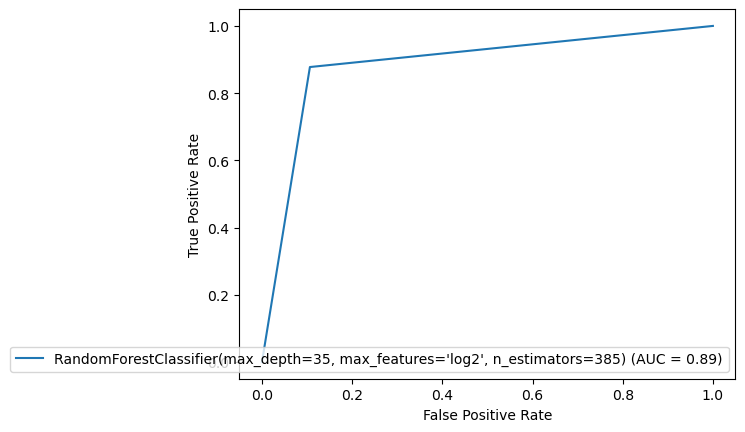

In [194]:

# Plot AUC_ROC curve

from sklearn import metrics
fpr,tpr,thresholds = metrics.roc_curve(y_test,Fraud_pred)
roc_auc = metrics.auc(fpr,tpr)
display = metrics.RocCurveDisplay(fpr = fpr, tpr = tpr, roc_auc=roc_auc,estimator_name=Fraud)
display.plot()